# **What's Up with Victorian Electricity Prices?**
## **Analysing historical data to inform future contract negotiations and storage venture  profitability**

![image2.jpg](images/image2.jpg)

### **Introduction**

Electricity price forecasting (EPF) has become an increasing area of interest and is commonly divided into short- to medium-term forecasting (hour-ahead or day-ahead forecasting) and medium- to long-term forecasting (month/s-ahead to year/s-ahead forecasting). Of the two, the latter is arguably the more difficult as it typically involves having to model and/or anticipate long-term variations in the relationship between electricity prices and relevant predictors. As a result, compared to the data-driven approach commonly used for short-term prediction, long-term EPFs have typically been obtained through the use of econometric, market-based models.

In spite of this, the primary objectives of the current analysis were to:
1. Investigate and provide a summary of how electricity prices changed over the course of a year
2. Develop a data-driven model that could provide a reasonable projection of daily Victorian electricity prices up to eighteen mmonths ahead and be used as a basis for future contract negotiations, and
3. Investigate and provide guidance on how much revenue could be generated by the proposed energy storage venture.

The author found that:
1. Both the retail price and average positive price time series were characterised by extreme price spikes typically occurring in the month of January.
2. Once these were removed, the annual patterns in the retail price data were more apparent. That is:
    - On average, prices were lowest in summer, highest in winter and middling in Autumn and spring.
    - On a calendar year basis, retail prices typically rose throughout the first half of the year to peak in June before consistently declining again until December.
    - Retail prices were typically lowest in January and February.
    - Whilst remaining consistent with the previously-observed trends, prices also varied throughout each month when aggregated to a weekly period.
    - Prices were noticably lower over the weekend compared to weekdays.
3. There were no strong relationships, linear or otherwise, between any of the current predictor variables and retail prices. A Spearman's correlation matrix indicated that the strongest linear relationships were with demand and historical lags of price. A series of scatter plots indicated that there was:
    - A positive relationship with demand
    - A u-shaped relationship with both minimum and maximum temperature
    - An upside-down u-shaped relationship with year (although this likely was due to external policy settings)
    - Very slight (and possibly statistically insignificant) upside-down u-shaped relationships with month, day of the year, and week of the year
    - Positive and approximately linear relationships with historical lags of itself (retail prices)
    - Relationships consistent with what had previously been observed in finding 2. 
4. Of the seven models developed, an ARIMA(5,1,2)(0,0,4) performed the best on the last eighteen months of retail price data set aside for model assessment. In addition, this was the only model that performed better than the naive benchmark model, which simply predicted future values as the last historical value with a seven day lag.
5. The use of a battery storage system could generate revenue of up to 302,000 AUD per annum. However, the derivation of this figure required some fairly strong assumptions that do not accurately reflect the electricity market and/or the properties of a battery (such as perfect day-ahead forecasting and no capacity/efficiency degredation over time.

It is recommended that:
1. The ARIMA model should be chosen as the starting point for future planning, but forecasts taken with a grain of salt at present given disappointing performance in relation to predicting unexpected changes in price trends.
2. Additional predictor variables sought and considered for inclusion as exogenous regressors that might be better correlated with electricity prices; for example network supply and generation costs or leading indicators of retail prices.
3. The chosen model developed to the point that forecasts are sufficiently robust and historical lags of the retail price can be considered for inclusion.
4. A more extensive feature selection process conducted to determine if there is a specific combination of features that can more accurately predict Victorian electricity prices.
5. A more robust methodology developed to estimate revenue potential from the use of a 70 MWh battery storage system.

<br>

### **Data and Methods**

The authors were provided with over five years of daily energy prices (2,106 observations) sourced from ([Kaggle](https://www.kaggle.com/aramacus/electricity-demand-in-victoria-australia)) along with a number of potential predictor variables, such as the date of the observation, temperature, rainfall, and whether or not it was a school day or holiday. See Table 1 below for details:

| **Variable**     | **Description**                                                                  |
| -----------------| -------------------------------------------------------------------------------- |
| date             | from January 1, 2015, to October 6, 2020                                         |
| demand           | daily electricity demand in MWh                                                  |
| price            | recommended retail price in AUD/MWh                                              |
| demand_pos_price | total daily demand at a positive price in MWh                                    |
| price_positive   | average positive price, weighted by the corresponding intraday demand in AUD/MWh |
| demand_neg_price | total daily demand at a negative price in MWh                                    |
| price_negative   | average negative price, weighted by the corresponding intraday demand in AUD/MWh |
| frac_neg_price   | the fraction of the day when the demand traded at a negative price               |
| min_temperature  | minimum temperature during the day in Celsius                                    |
| max_temperature  | maximum temperature during the day in Celsius                                    |
| solar_exposure   | total daily sunlight energy in MJ/m^2                                            |
| rainfall         | daily rainfall in mm                                                             |
| school_day       | "Y" if that day was a school day, "N" otherwise                                  |
| holiday          | "Y" if the day was a state or national holiday, "N" otherwise                    |

The analysis was divided into three parts. The first part involved a fairly extensive exploratory data analysis in order to observe any major trends or patterns in the provided data and to determine the major drivers or relationships between energy prices and the feature variables. This included answering the first part of the brief, which was to identify how electricity prices changed over the course of the year.

The second part used the results of the first to inform the development of several potential forecasting models, including a benchmark naive model, an Autoregressive Integrated Moving Average (ARIMA) model with and without exogenous regressors, a time series linear model, a Prophet model, and a feed-forward neural network. The performance of all models was assessed using a holdout set of the last 548 days of data, but where possible, performance was also assessed using time series cross-validation.

The final part was devoted solely to answering the final main objective, which was to determine the annual revenue potential from the use of a 70 MWh storage system to capture energy when pricing conditions are unfavourable and sell it by the next day if prices are higher. In practically, the approach taken by the author for this section was to simply determine the price differential between the retail price of any single day and the immediately following day. If the price differential was positive; that is, the retail pricewas higher on the following day, then the battery was charged to capacity and the revenue calculated by multiplying the price differential by the maximum capacity of the battery. If the price differential was 0 or negative, then revenue was set to zero. There were a large number of assumptions underlying this simple methodology, which have been detailed in Part C of the Results and Analysis section of the report.

The analysis was conducted entirely in R, using primarily the `tidyverse` and `tidyverts` package families.

<br>

### **Results and Analysis**

#### *Part A - Exploratory Data Analysis*

In [52]:
# suppress warnings
options(warn=-1)

In [2]:
install.packages(c("corrplot", "cowplot", "fable.prophet", "feasts", "fable", "fabletools", "naniar", "tsibble", "urca"))

Installing corrplot [0.92] ...
	OK [linked cache]
Installing cowplot [1.1.1] ...
	OK [linked cache]
Installing tsibble [1.1.1] ...
	OK [linked cache]
Installing fabletools [0.3.2] ...
	OK [linked cache]
Installing fable.prophet [0.1.0] ...
	OK [linked cache]
Installing feasts [0.2.2] ...
	OK [linked cache]
Installing fable [0.3.1] ...
	OK [linked cache]
Installing naniar [0.6.1] ...
	OK [linked cache]
Installing urca [1.3-0] ...
	OK [linked cache]


In [3]:
# general libraries
library(tidyverse)
library(RColorBrewer)
library(scales)
library(cowplot)
library(corrplot)
library(naniar)

# libraries for time series analysis and forecasting
library(tsibble)
library(lubridate)
library(zoo)
library(feasts)
library(fable)
library(fable.prophet)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.5     ✔ purrr   0.3.4
✔ tibble  3.1.6     ✔ dplyr   1.0.8
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


Attaching package: ‘scales’


The following object is masked from ‘package:purrr’:

    discard


The following object is masked from ‘package:readr’:

    col_factor


corrplot 0.92 loaded


Attaching package: ‘tsibble’


The following object is masked from ‘package:naniar’:

    pedestrian


The following objects are masked from ‘package:base’:

    intersect, setdiff, union



Attaching package: ‘lubridate’


The following object is masked from ‘package:tsibble’:

    interval


The following object is masked from ‘package:cowplot’:

    stamp


The following objects are masked from ‘package:base’:

   

In [4]:
# function to add an overall title to any grid of ggplots
addJointTitle <- function(title_text) {
    title <- ggdraw() +
    draw_label(title_text,
               size = 18,
               x = 0,
               hjust = 0) +
    theme(
      plot.margin = margin(t = 0, r = 0, b = 0, l = 7)
    )
}

# function to define a reversed 'not in' operator
'%!in%' <- function(x, y)!('%in%'(x, y))

# function to calculate the significance of the correlations
# mat : is a matrix of data
# ... : additional arguments to pass to the native R cor.test function
corMtest <- function(mat, ...) {
    mat <- as.matrix(mat)
    n <- ncol(mat)
    p_mat<- matrix(NA, n, n)
    diag(p_mat) <- 0
    for (i in 1:(n - 1)) {
        for (j in (i + 1):n) {
            tmp <- cor.test(mat[, i], mat[, j], ...)
            p_mat[i, j] <- p_mat[j, i] <- tmp$p.value
        }
    }
    colnames(p_mat) <- rownames(p_mat) <- colnames(mat)
    p_mat
}

# gg_tsresiduals - time series plot, ACF and histogram of model residuals
plotggtsresiduals <- function(model) {
    options(repr.plot.width=20, repr.plot.height=10)
    p1 <- model %>% augment() %>% autoplot(.vars = .innov) + geom_point() + theme_report()
    p2 <- model %>% augment() %>% ACF(.innov) %>% autoplot() + theme_report()
    p3 <- model %>% augment() %>% ggplot(aes(.innov)) + geom_histogram(binwidth = 30) + geom_rug() + theme_report()

    plot_grid(p1, p2, p3)
}

plotggtsresiduals2 <- function(model, plot_title) {
    #options(repr.plot.width=20, repr.plot.height=8)
    title = addJointTitle(plot_title)
    p1 <- model %>% augment() %>% autoplot(.vars = .innov) + geom_point() + theme_report()
    p2 <- model %>% augment() %>% ACF(.innov) %>% autoplot() + theme_report()

    plot_plots <- plot_grid(p1, p2, ncol = 2)
    plot_grid(title, plot_plots, ncol = 1, rel_heights = c(0.1, 1.5))
}

# gg_tsdisplay - time series plot, ACF, PACF, histogram, 
plotggtsdisplay <- function(data, var, diff_var) {
    options(repr.plot.width=20, repr.plot.height=10)
    p1 <- data %>% autoplot(.vars = {{var}}) + geom_point() + theme_report()
    p2 <- data %>% ggplot(aes({{var}})) + geom_histogram(binwidth = 30) + geom_rug() + theme_report()
    p3 <- data %>% ACF({{diff_var}}) %>% autoplot() + theme_report()
    p4 <- data %>% PACF({{diff_var}}) %>% autoplot() + theme_report()

    plot_grid(p1, p2, p3, p4)
}

# customised ggplot2 themes
theme_report <- function() {
    theme_classic() +
    theme(
        axis.text = element_text(size = 12),
        axis.title = element_text(size = 14),
        plot.title = element_text(size = 16),
        legend.text = element_text(size = 12),
        legend.title = element_text(size = 14)
    )
}

theme_report_angled <- function() {
    theme_classic() +
    theme(
        axis.text.x = element_text(angle = 30, hjust = 1),
        axis.text = element_text(size = 12),
        axis.title = element_text(size = 14),
        plot.title = element_text(size = 16),
        legend.text = element_text(size = 12),
        legend.title = element_text(size = 14)
    )
}

In [5]:
df_orig <- readr::read_csv('./data/energy_demand.csv')

df_orig <- df_orig %>% select(date, price, everything())

# convert to tsibble
df_orig <- as_tsibble(df_orig, index = date)
str(df_orig)
summary(df_orig)

Rows: 2106 Columns: 14
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr   (2): school_day, holiday
dbl  (11): demand, price, demand_pos_price, price_positive, demand_neg_price...
date  (1): date

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


tbl_ts [2,106 × 14] (S3: tbl_ts/tbl_df/tbl/data.frame)
 $ date            : Date[1:2106], format: "2015-01-01" "2015-01-02" ...
 $ price           : num [1:2106] 25.6 33.1 34.6 25 26.7 ...
 $ demand          : num [1:2106] 99635 129606 142301 104331 118132 ...
 $ demand_pos_price: num [1:2106] 97319 121082 142301 104331 118132 ...
 $ price_positive  : num [1:2106] 26.4 38.8 34.6 25 26.7 ...
 $ demand_neg_price: num [1:2106] 2316 8524 0 0 0 ...
 $ price_negative  : num [1:2106] -7.24 -47.81 0 0 0 ...
 $ frac_neg_price  : num [1:2106] 0.0208 0.0625 0 0 0 ...
 $ min_temperature : num [1:2106] 13.3 15.4 20 16.3 15 17.7 18.9 23.1 16.5 13.6 ...
 $ max_temperature : num [1:2106] 26.9 38.8 38.2 21.4 22 26 37.4 28.2 18 21.7 ...
 $ solar_exposure  : num [1:2106] 23.6 26.8 26.5 25.2 30.7 31.6 20.7 13.5 3.1 5.6 ...
 $ rainfall        : num [1:2106] 0 0 0 4.2 0 0 0 19.4 1.2 5.2 ...
 $ school_day      : chr [1:2106] "N" "N" "N" "N" ...
 $ holiday         : chr [1:2106] "Y" "N" "N" "N" ...
 - attr(*,

      date                price              demand       demand_pos_price
 Min.   :2015-01-01   Min.   :  -6.076   Min.   : 85094   Min.   : 41988  
 1st Qu.:2016-06-10   1st Qu.:  38.707   1st Qu.:109964   1st Qu.:109246  
 Median :2017-11-18   Median :  66.597   Median :119586   Median :119148  
 Mean   :2017-11-18   Mean   :  76.080   Mean   :120035   Mean   :119252  
 3rd Qu.:2019-04-28   3rd Qu.:  95.075   3rd Qu.:130436   3rd Qu.:130119  
 Max.   :2020-10-06   Max.   :4549.645   Max.   :170654   Max.   :170654  
                                                                          
 price_positive    demand_neg_price  price_negative     frac_neg_price    
 Min.   :  13.57   Min.   :    0.0   Min.   :-342.220   Min.   :0.000000  
 1st Qu.:  39.12   1st Qu.:    0.0   1st Qu.:   0.000   1st Qu.:0.000000  
 Median :  66.87   Median :    0.0   Median :   0.000   Median :0.000000  
 Mean   :  76.55   Mean   :  783.2   Mean   :  -2.686   Mean   :0.008547  
 3rd Qu.:  95.13   3rd Qu

From Figures 1 and 2, it is immediately obvious that the average positive price very much mirrored the overall recommended retail price and, perhaps more importantly, that the series was characterised by several large price spikes during the month of January. For the purposes of robust model development, outlying price spikes such as these were identified, removed and then interpolated using a basic ARIMA model. The identification process consisted of decomposing each price time series into its respective trend, seasonal and remainder components with a Seasonal and Trend using Loess (STL) method and then defining an outlier as any observation in which the remainder component was outside the 25th or 75th quantile plus or minus 3 times the interquartile range (IQR).^[1]

As had been hoped, this made very little difference to the overall distributions of the recommended retail price and the average positive price time series whilst showing the actual trends and patterns in the series (See Table 1 and Figure 4). The methodology failed to produce satisfactory results when applied to the average negative price time series, and therefore this variable was left in its unadjusted/original form. Finally, note that from this point forward, unless otherwise specified, the term 'retail price' means the recommended retail price with outliers removed, not the original series.

[1]: That is, less than the `25th quantile - 3 * IQR` *or* more than the `75th quantile + 3 * IQR`.

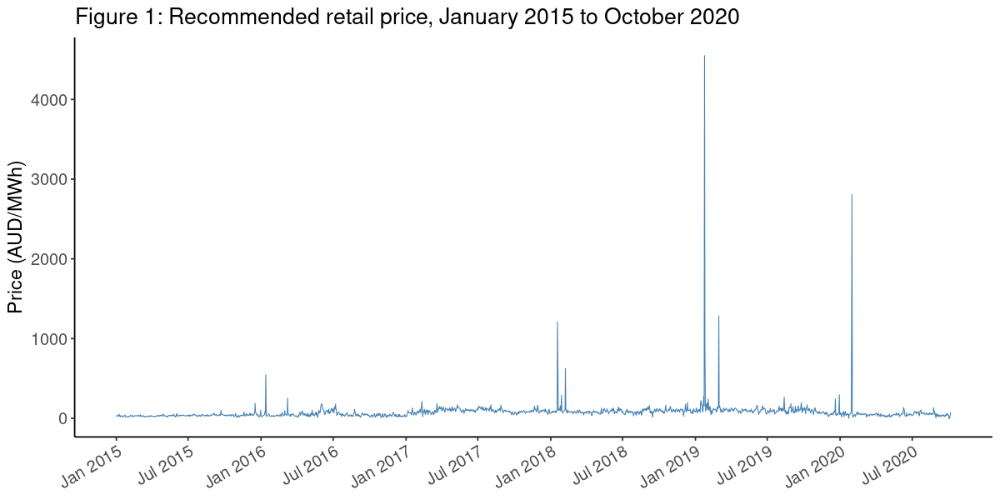

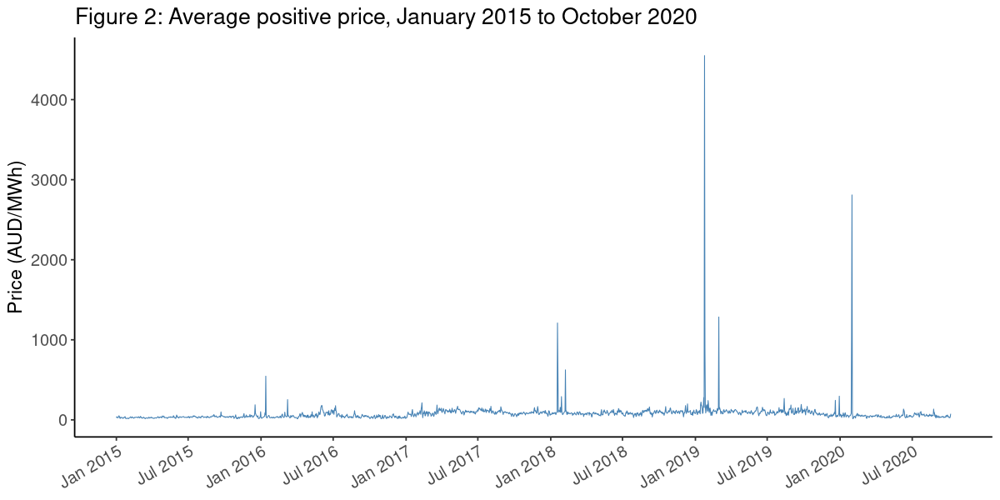

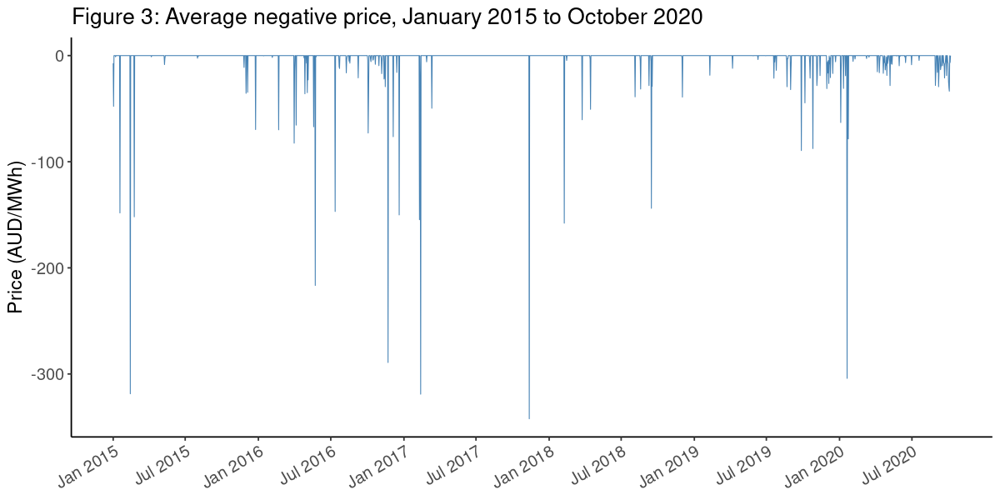

In [6]:
date_breaks <- seq(min(df_orig$date), max(df_orig$date), by = "6 month")

i <- 1
letters <- c('a', 'b', 'c')
titles <- c("Recommended retail price, January 2015 to October 2020", 
            "Average positive price, January 2015 to October 2020", 
            "Average negative price, January 2015 to October 2020")

for (col in c("price", "price_positive", "price_negative")) {
    ggpl <- ggplot(df_orig, aes(x = date, y = .data[[col]])) +
    geom_line(colour = "steelblue", size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL, 
         y = "Price (AUD/MWh)",
         title = paste0("Figure ", i, ": ", titles[i])) +
    theme_report_angled()
    
    assign(paste0("p", i), ggpl)
    i <- i + 1
}

# change plot dimensions 
options(repr.plot.width=10, repr.plot.height=5)
p1
p2
p3

In [7]:
# make a copy of the dataframe
df <- data.table::copy(df_orig)

# decompose the prices and identify outliers using the IQR
outlier_decomp <- df %>%
    model(stl = STL(price ~ season(period = 1), robust = TRUE)) %>% 
    components() %>% 
    filter(remainder < quantile(remainder, 0.25) - 3*IQR(remainder) | remainder > quantile(remainder, 0.75) + 3*IQR(remainder))

outlier_miss <- df %>% 
    anti_join(outlier_decomp, by = c("date", "price")) %>% 
    fill_gaps()

# replace the values with an ARIMA-based interpolation
outlier_fill <- outlier_miss %>% 
    model(ARIMA(price)) %>% 
    interpolate(outlier_miss)

df$adjprice = outlier_fill$price

price_comp <- bind_rows(summary(df$price), summary(df$adjprice)) %>% mutate(Series = c("Actual", "Adjusted"))

In [8]:
# nb: this isn't the way I wanted to do it, but I couldn't get a function or loop-based approach to work
# decompose the prices and identify outliers using the IQR
outlier_decomp <- df %>%
    model(stl = STL(price_positive ~ season(period = 1), robust = TRUE)) %>% 
    components() %>% 
    filter(remainder < quantile(remainder, 0.25) - 3*IQR(remainder) | remainder > quantile(remainder, 0.75) + 3*IQR(remainder))

outlier_miss <- df %>% 
    anti_join(outlier_decomp, by = c("date", "price_positive")) %>% 
    fill_gaps()

# replace the values with an ARIMA-based interpolation
outlier_fill <- outlier_miss %>% 
    model(ARIMA(price_positive)) %>% 
    interpolate(outlier_miss)

df$adjprice_positive = outlier_fill$price_positive

price_positive_comp <- bind_rows(summary(df$price_positive), summary(df$adjprice_positive)) %>% mutate(Series = c("Actual", "Adjusted"))

In [9]:
# observe that this didn't work so well and there are some odd results
# decompose the prices and identify outliers using the IQR
outlier_decomp <- df %>%
    model(stl = STL(price_negative ~ season(period = 1), robust = TRUE)) %>% 
    components() %>% 
    filter(remainder < quantile(remainder, 0.25) - 3*IQR(remainder) | remainder > quantile(remainder, 0.75) + 3*IQR(remainder))

outlier_miss <- df %>% 
    anti_join(outlier_decomp, by = c("date", "price_negative")) %>% 
    fill_gaps()

# replace the values with an ARIMA-based interpolation
outlier_fill <- outlier_miss %>% 
    model(ARIMA(price_negative)) %>% 
    interpolate(outlier_miss)

# add the new variables to the dataframe
df <- merge(df, outlier_fill, by = c("date"), all.x = TRUE)
df <- df %>% rename(price_negative = price_negative.x, 
                    adjprice_negative = price_negative.y)
df$adjprice_negative <- ifelse(is.na(df$adjprice_negative), df$price_negative, df$adjprice_negative)

# manually adjust positive prices back to zero
df$adjprice_negative <- ifelse(df$adjprice_negative > 0 | df$adjprice_negative < -20, 0, df$adjprice_negative)

price_negative_comp <- bind_rows(summary(df$price_negative), summary(df$adjprice_negative)) %>% mutate(Series = c("Actual", "Adjusted"))

In [10]:
comp_table <- bind_rows(price_comp, price_positive_comp, price_negative_comp) %>% 
  mutate(`Price Series` = rep(c("Rec. Retail", "Avg. Positive", "Avg. Negative"), each = 2)) %>% 
  mutate(across(where(is.numeric), ~ round(.x, digits = 2))) %>% 
  select(`Price Series`, Series, everything())

"Table 1: Comparison of the raw and outlier-adjusted price series"
comp_table

[1] "Table 1: Comparison of the raw and outlier-adjusted price series"

Price Series,Series,Min.,1st Qu.,Median,Mean,3rd Qu.,Max.
<chr>,<chr>,<table>,<table>,<table>,<table>,<table>,<table>
Rec. Retail,Actual,-6.08,38.71,66.60,76.08,95.08,4549.65
Rec. Retail,Adjusted,-6.08,38.71,66.41,68.90,94.31,178.08
Avg. Positive,Actual,13.57,39.12,66.87,76.55,95.13,4549.65
Avg. Positive,Adjusted,13.57,39.12,66.68,69.32,94.47,177.86
Avg. Negative,Actual,-342.22,0.00,0.00,-2.69,0.00,0.00
Avg. Negative,Adjusted,-8.76,0.00,0.00,-0.11,0.00,0.00


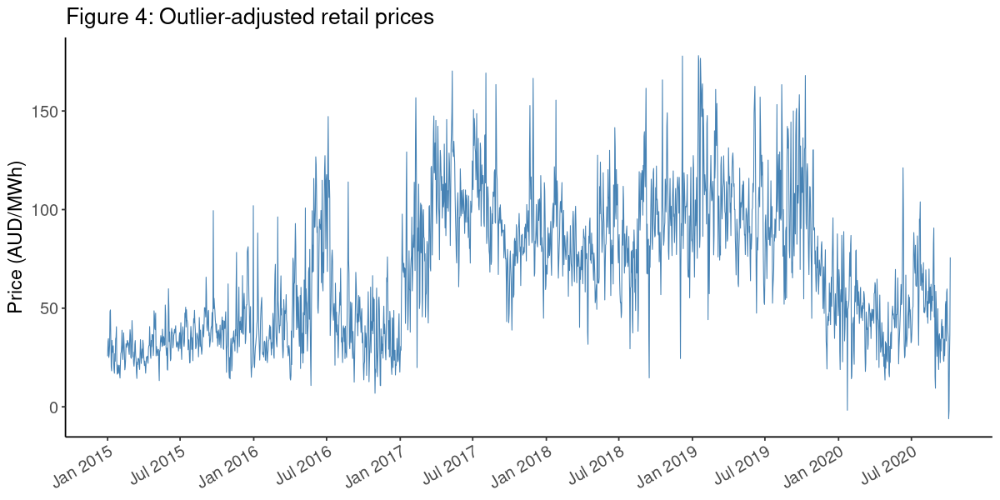

In [11]:
# plot the revised series
ggplot(df, aes(x = date, y = adjprice)) +
    geom_line(color = "steelblue", size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL,
         y = "Price (AUD/MWh)",
         title = "Figure 4: Outlier-adjusted retail prices") +
    theme_report_angled()

In [12]:
df$year = year(df$date)
df$month = month(df$date, label = TRUE)
df$dayofmonth = mday(df$date)
df$dayofyear = yday(df$date)
df$dayofweek = wday(df$date, label = TRUE, week_start = getOption("lubridate.week.start", 1))
df$weekofyear = week(df$date)

df$calendarseason <- ifelse(df$month %in% c("Sep", "Oct", "Nov"), "Spring",
                            ifelse(df$month %in% c("Dec", "Jan", "Feb"), "Summer",
                                   ifelse(df$month %in% c("Mar", "Apr", "May"), 
                                          "Autumn",
                                          "Winter"))) %>% 
    factor(levels = c("Spring", "Summer", "Autumn", "Winter"), ordered = TRUE)

df$weekend <- ifelse(df$dayofweek %in% c("Sat", "Sun"), "Y", "N") %>% factor()

df$working_day <- ifelse(df$weekend != "Y" & df$holiday != "Y", "Y", "N") %>% factor()

In [13]:
df$negative_prices <- ifelse(df$price_negative < 0, "Y", "N") %>% factor()

df$price_spike <- ifelse(df$price > 300 | df$price < 0, "Y", "N") %>% factor()

df$rained <- ifelse(df$rainfall > 0, "Y", "N") %>% factor()

df$temperature_range <- df$max_temperature - df$min_temperature

In [14]:
df$school_day <- factor(df$school_day, levels = c("N", "Y"))
df$holiday <- factor(df$holiday, levels = c("N", "Y"))

In [15]:
generate_summary_stats <- function(input_df, input_var, grp_var) {
    output_df <- input_df %>% 
        as_tibble() %>% 
        group_by({{grp_var}}) %>% 
        summarise(mean = mean({{input_var}}),
                  sd = sd({{input_var}}),
                  min = min({{input_var}}),
                  max = max({{input_var}}),
                  median = median({{input_var}}),
                  iqr = IQR({{input_var}}),
                  mad = mad({{input_var}}),
                  q10 = quantile({{input_var}}, probs = 0.1),
                  q25 = quantile({{input_var}}, probs = 0.25),
                  q75 = quantile({{input_var}}, probs = 0.75),
                  q90 = quantile({{input_var}}, probs = 0.90),
                  upper_bound = q75 + 1.5 * IQR({{input_var}}),
                  extreme_upper_bound = q75 + 3 * IQR({{input_var}}),
                  lower_bound = q25 - 1.5 * IQR({{input_var}})) %>% 
        rename(feature_value = {{grp_var}})
  
    output_df <- output_df %>% 
        mutate(across(where(is.numeric) & feature_value, as.character)) %>%
        mutate(across(where(is.factor) & feature_value, as.character))
}

generate_summary_stats_df <- function(input_df, input_var) {
    prices_by_season <- generate_summary_stats({{input_df}}, {{input_var}}, calendarseason)
    prices_by_season$feature_group <- "season"

    prices_by_month <- generate_summary_stats({{input_df}}, {{input_var}}, month)
    prices_by_month$feature_group <- "month"

    prices_by_dayofmonth <- generate_summary_stats({{input_df}}, {{input_var}}, dayofmonth)
    prices_by_dayofmonth$feature_group <- "day of month"

    prices_by_weekofyear <- generate_summary_stats({{input_df}}, {{input_var}}, weekofyear)
    prices_by_weekofyear$feature_group <- "week of year"

    prices_by_dayofweek <- generate_summary_stats({{input_df}}, {{input_var}}, dayofweek)
    prices_by_dayofweek$feature_group <- "day of week"

    prices_by_holiday <- generate_summary_stats({{input_df}}, {{input_var}}, holiday)
    prices_by_holiday$feature_group <- "holiday"

    prices_by_weekend <- generate_summary_stats({{input_df}}, {{input_var}}, weekend)
    prices_by_weekend$feature_group <- "weekend"
  
    price_stats = bind_rows(prices_by_season, prices_by_month, prices_by_dayofmonth, prices_by_weekofyear, prices_by_dayofweek, prices_by_holiday, prices_by_weekend)
}

price_summary_stats = generate_summary_stats_df(df, price)
adj_price_summary_stats = generate_summary_stats_df(df, adjprice)

Figures 5 through shows the distribution of recommended retail prices across (that is, from top left to bottom right respectively) the four seasons, month, week of the calendar year, and day of the week. It indicates that historically prices have:
- Been lowest in summer and highest in winter
- Been lowest in the first three months of the year before rising to peak in June and then slowly decreasing across the second half of the year
- Varied slightly within each month, but still showing the pattern observed above
- Remained relatively consistent, albeit higher, during the working week compared to the weekend.
- Increased from Mondays to Thursdays, before declining again on Fridays.

The trends in the average positive prices were very similar to what was observed for the retail prices, but there was little to be gleaned from the average negative prices. (See Appendix B). 

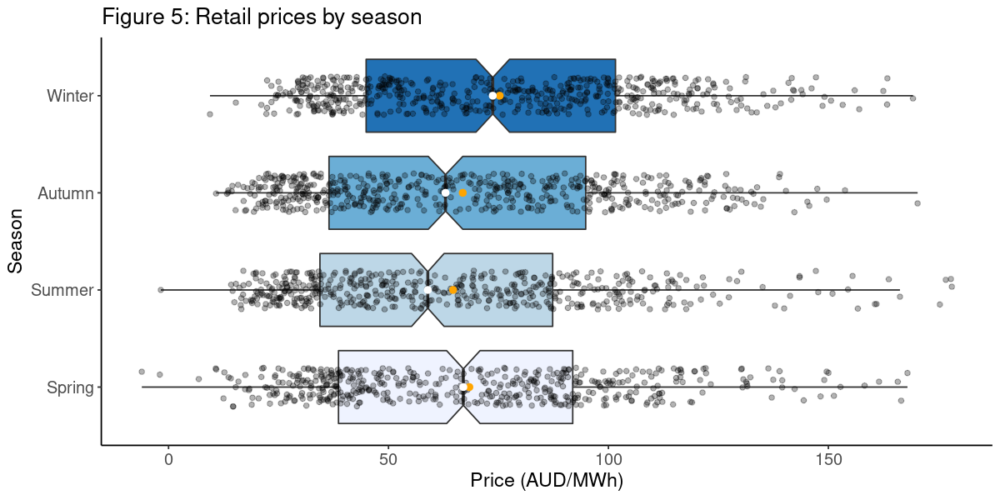

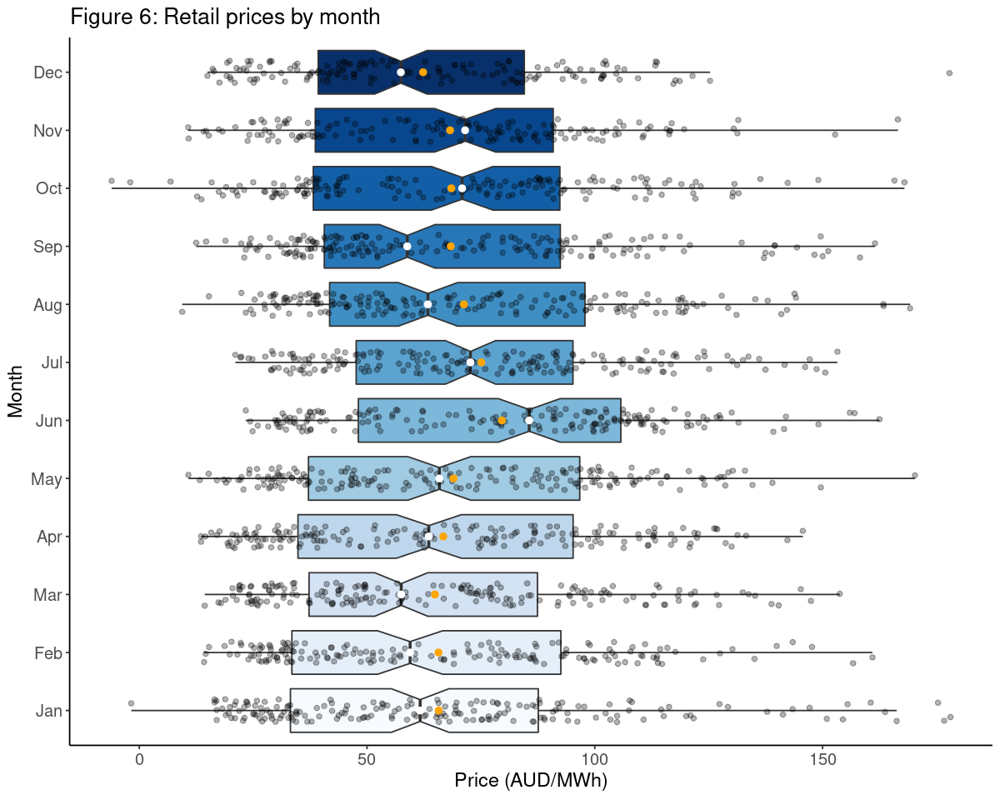

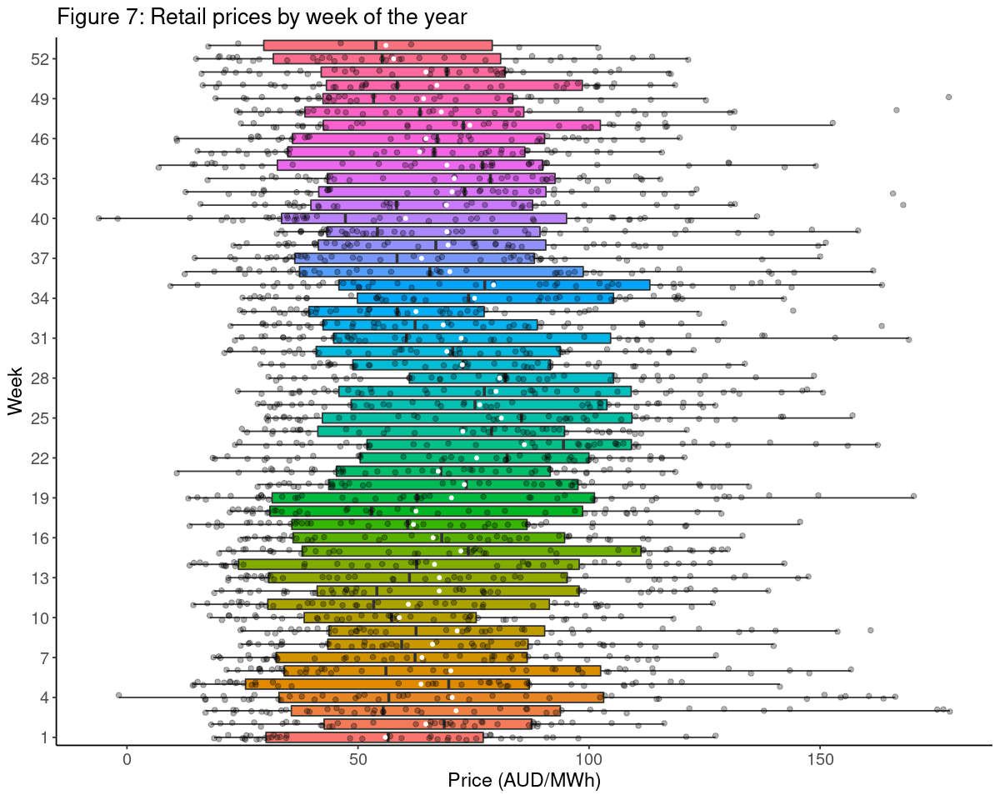

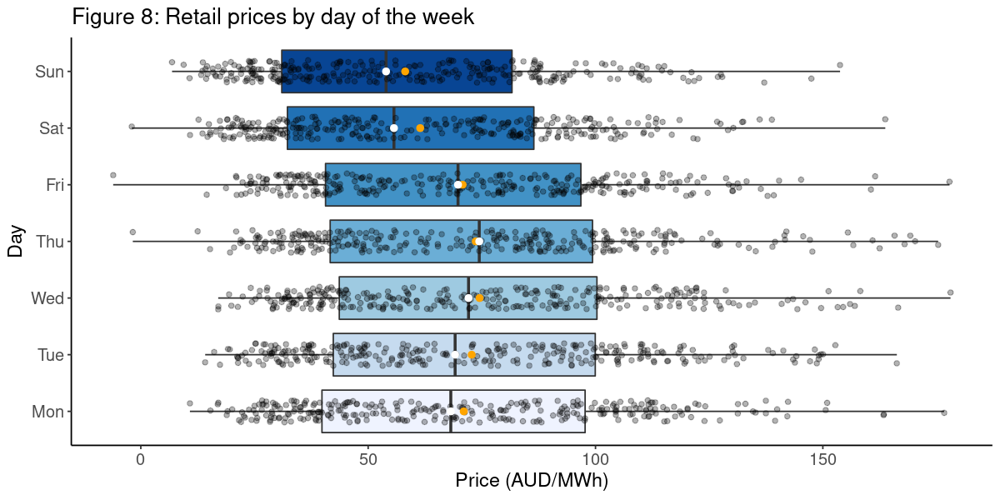

In [16]:
options(repr.plot.width=10, repr.plot.height=5)
df %>%
    as_tibble() %>% 
    group_by(calendarseason) %>% 
    ggplot(aes(x = calendarseason, y = adjprice, fill = calendarseason)) +
    geom_boxplot(notch = TRUE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Season",
         y = "Price (AUD/MWh)",
         title = "Figure 5: Retail prices by season") +
    scale_fill_brewer() +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

# extend the blues palette from 9 to 12 colours   
num_colours <- length(unique(df$month))
new_palette <- colorRampPalette(brewer.pal(9, "Blues"))(num_colours)

options(repr.plot.width=10, repr.plot.height=8)
df %>%
    as_tibble() %>% 
    group_by(month) %>% 
    ggplot(aes(x = month, y = adjprice, fill = month)) +
    geom_boxplot(notch = TRUE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Month",
         y = "Price (AUD/MWh)",
         title = "Figure 6: Retail prices by month") +
    scale_fill_manual(values = new_palette) +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

options(repr.plot.width=10, repr.plot.height=8)
df %>%
    as_tibble() %>% 
    group_by(weekofyear) %>% 
    ggplot(aes(x = factor(weekofyear), y = adjprice, fill = factor(weekofyear))) +
    geom_boxplot(notch = FALSE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "white", size = 1) +
    labs(x = "Week",
         y = "Price (AUD/MWh)",
         title = "Figure 7: Retail prices by week of the year") +
    scale_x_discrete(breaks = seq(1, 52, by = 3)) +
    guides(fill = "none") +
    coord_flip() +
    theme_report() 

options(repr.plot.width=10, repr.plot.height=5)
df %>%
    as_tibble() %>% 
    group_by(dayofweek) %>% 
    ggplot(aes(x = dayofweek, y = adjprice, fill = dayofweek)) +
    geom_boxplot(notch = FALSE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Day",
         y = "Price (AUD/MWh)",
         title = "Figure 8: Retail prices by day of the week") +
    scale_fill_brewer() +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

In [17]:
df <- df %>% mutate(adjprice_diff = difference(adjprice),
                    adjprice_lag = lag(adjprice),
                    adjprice_lag2 = lag(adjprice, 2),
                    adjprice_lag3 = lag(adjprice, 3),
                    adjprice_lag4 = lag(adjprice, 4),
                    adjprice_lag5 = lag(adjprice, 5),
                    adjprice_lag6 = lag(adjprice, 6),
                    adjprice_wlag = lag(adjprice, 7),
                    adjprice_mlag = lag(adjprice, 30),
                    adjprice_ylag = lag(adjprice, 365)) %>% 
    as_tsibble(index = date)

Figures 9 and 10 below suggest that there was some fairly complex seasonality underlying the retail price time series.

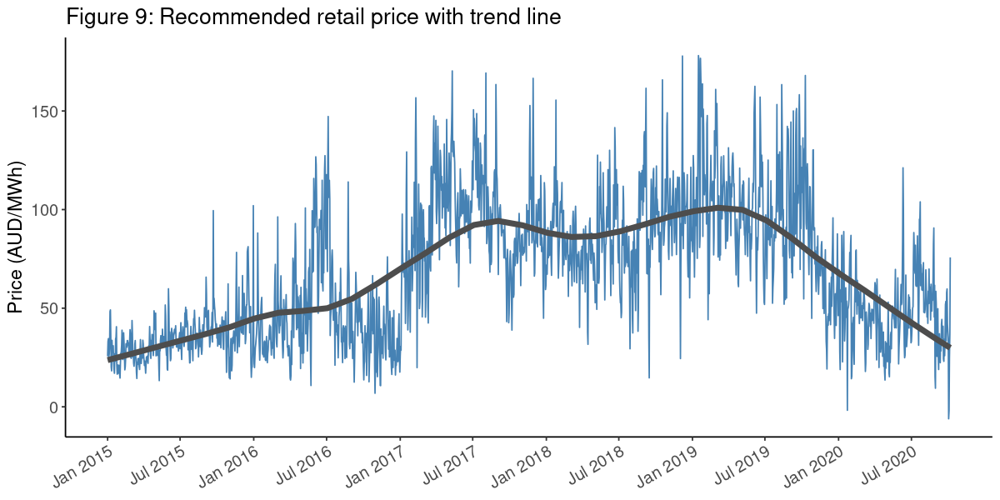

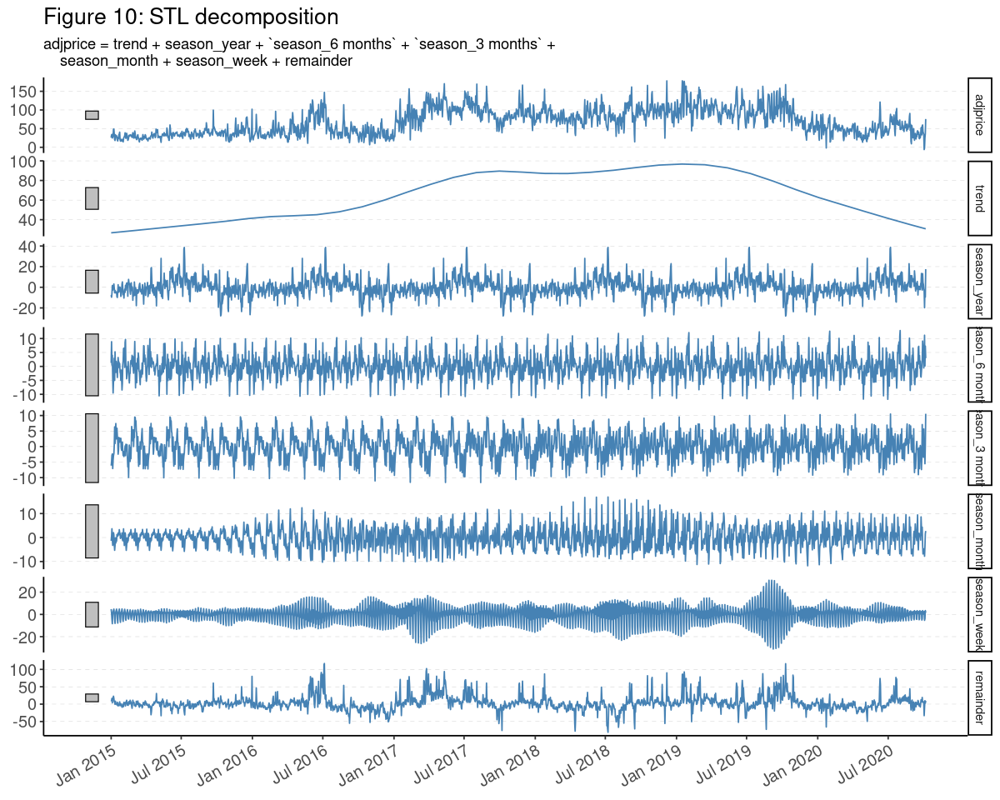

In [18]:
# seasonal decomposition of the adjusted series
price_comp <- df %>% model(stl = STL(adjprice))

components(price_comp) %>% 
    as_tsibble() %>% 
    autoplot(adjprice, colour = "steelblue") +
    geom_line(aes(y = trend), color = "gray30", size = 2) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure 9: Recommended retail price with trend line",
         x = NULL,
         y = "Price (AUD/MWh)") +
    theme_report_angled()

options(repr.plot.width=10, repr.plot.height=8)
df %>%
    model(STL(adjprice ~ trend() + season("year") + season("6 months") + season("3 months") + season("month") + season("week"), robust = TRUE)) %>% 
    components() %>% 
    autoplot(col = 'steelblue') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL,
         title = "Figure 10: STL decomposition") +
    theme_report_angled() +
    theme(panel.grid.major.y = element_line(color = "gray", size = 0.1, linetype = 2))

Furthermore, not only do the autocorrelation and partial autocorrelations of the recommended retail price over the previous 128 days indicate that the raw series was non-stationary (the mean value of the series changes with time), but that prices at any single point in time were most strongly correlated with values up to about a month prior (Figures 11 through 14).

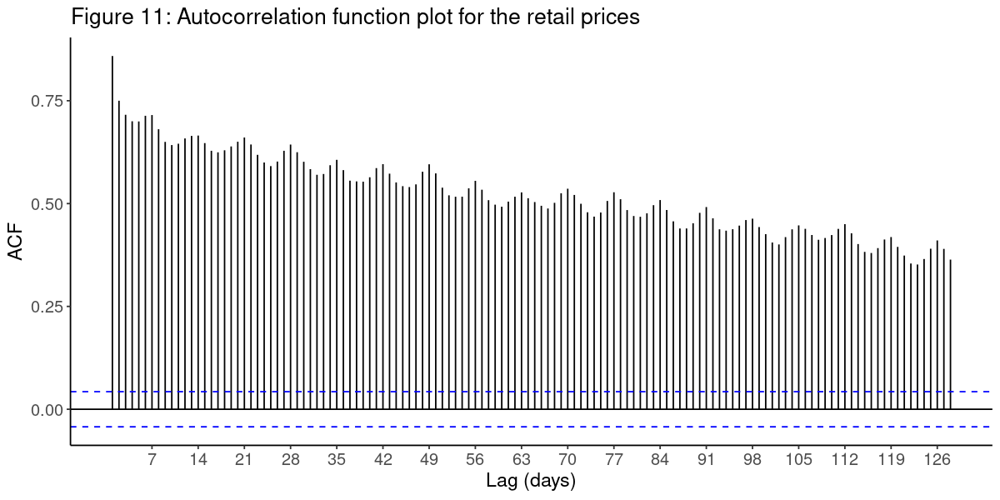

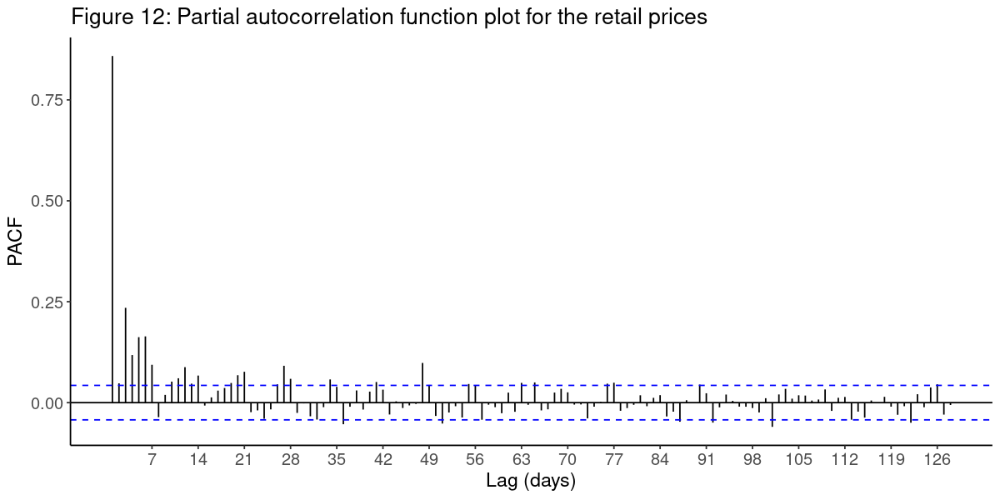

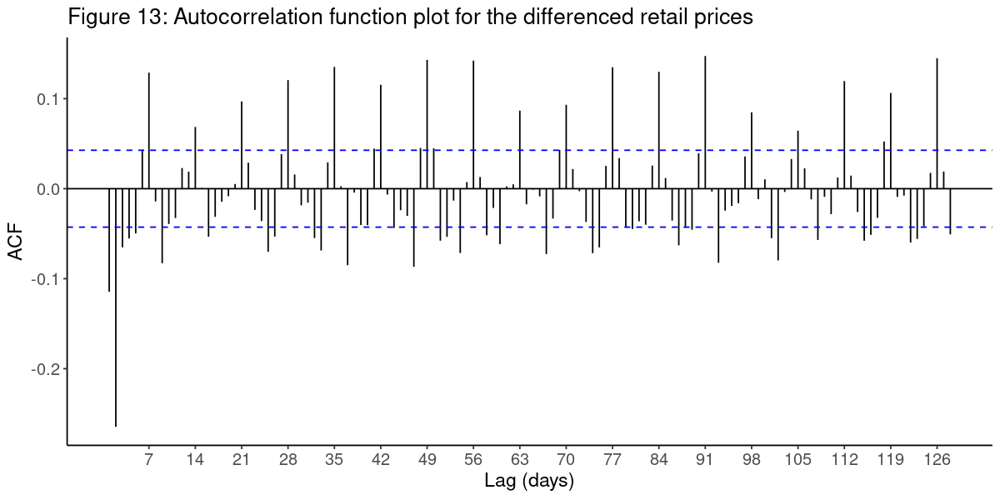

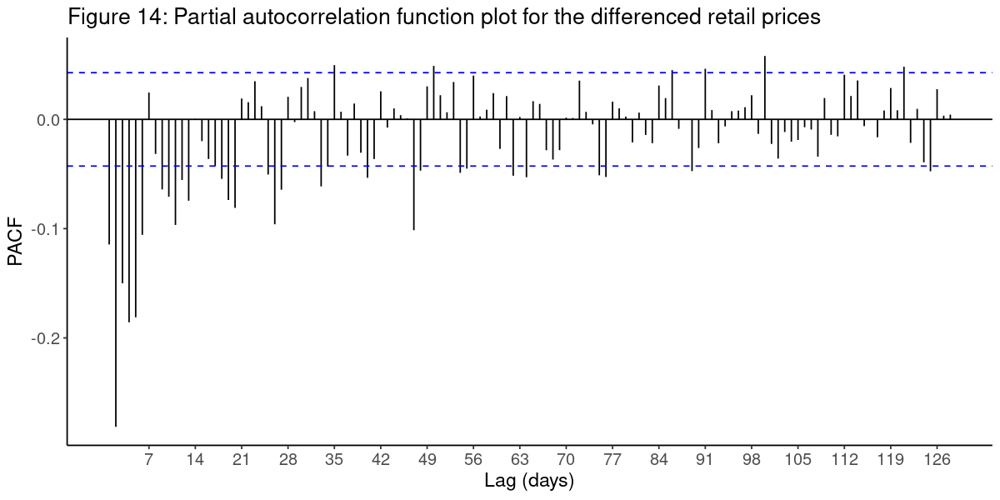

In [19]:
# plot autocorrelation and partial autocorrelation plots
options(repr.plot.width=10, repr.plot.height=5)
df %>% 
    ACF(adjprice, lag_max = 128) %>% 
    autoplot() +
    labs(x = "Lag (days)",
         y = "ACF",
         title = "Figure 11: Autocorrelation function plot for the retail prices") +
    theme_report()

df %>% 
    PACF(adjprice, lag_max = 128) %>% 
    autoplot() +
    labs(x = "Lag (days)",
         y = "PACF",
         title = "Figure 12: Partial autocorrelation function plot for the retail prices") +
    theme_report()

df %>% 
    ACF(adjprice_diff, lag_max = 128) %>% 
    autoplot() +
    labs(x = "Lag (days)",
         y = "ACF",
         title = "Figure 13: Autocorrelation function plot for the differenced retail prices") +
    theme_report()

df %>% 
    PACF(adjprice_diff, lag_max = 128) %>% 
    autoplot() +
    labs(x = "Lag (days)",
         y = "PACF",
         title = "Figure 14: Partial autocorrelation function plot for the differenced retail prices") +
    theme_report()

The next section mainly revolved around looking for the most pertinent predictors of retail prices. The approach taken was primarily a visual one, and consisted of examining the cross-correlation functions for each of the potential predictors with the differenced retail price, and a Spearman's correlation matrix.

The cross-correlation analysis (Figure B.16 in the Appendix) indicated relationships between the differenced retail price and:
- The average positive and negative prices and their respective demands,
- Retail price demand,
- The fraction of the day traded at negative prices,
- The maximum temperature, 
- Solar exposure, 
- Rainfall/whether or not it rained, 
- Whether or not it was a holiday, 
- The day of the week, 
- Whether or not the day was a weekend, 
- Whether or not negative prices occurred that day, and 
- The temperature range.

In contrast, the linear correlation analysis (Figure 15) indicated that the retail price was:
- Highly correlated with lags of itself up to a month prior to the current value, and the average positive price
- Moderately correlated with demand, the fraction of the day traded at negative prices, the average negative price and whether or not negative prices occurred that day, and
- Weakly correlated with whether or not the day was a weekend, holiday or school day, and the day of the week.

[1] "Figure 15: Spearman linear variable correlations"

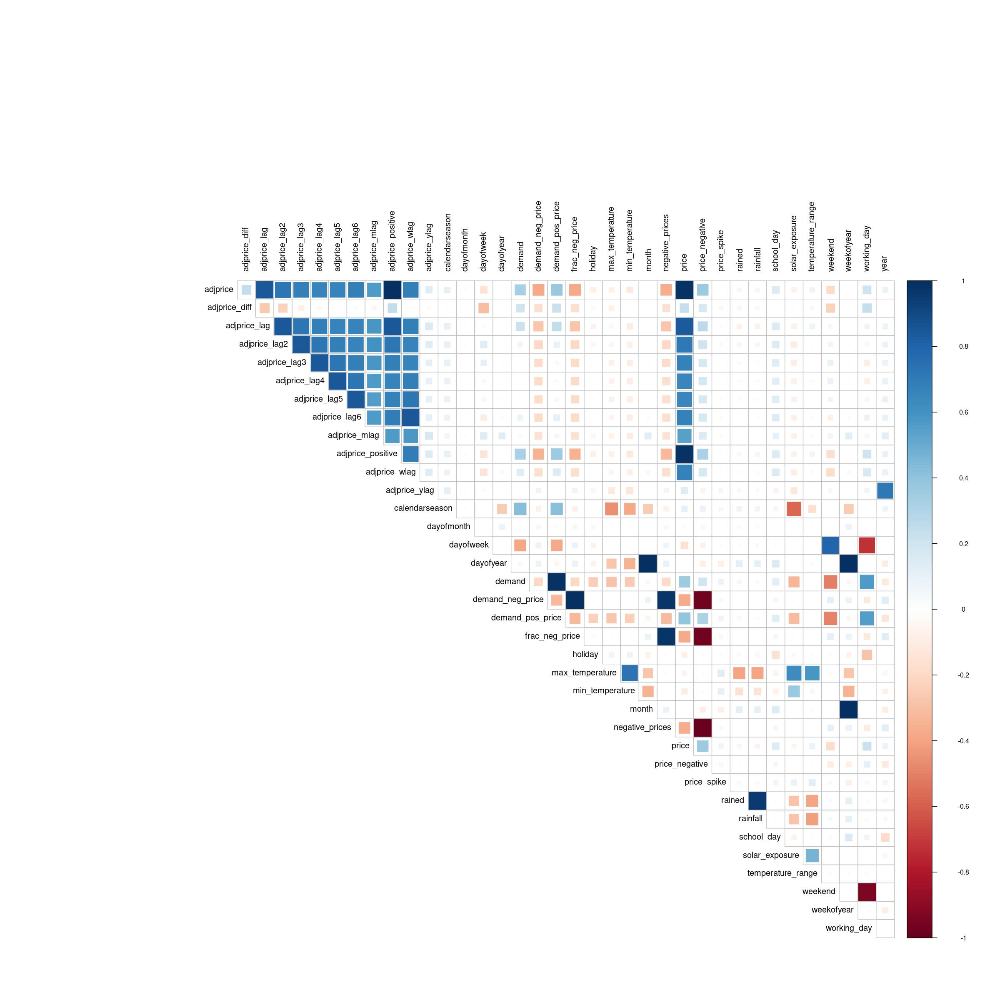

In [20]:
# select features and convert all to a numeric data type
df_num <- df %>% 
    as_tibble() %>% 
    select(-c(date, price_positive, adjprice_negative)) %>% 
    mutate_if(is.factor, as.numeric)

# calculate the correlations and their statistical significance
corr_mat <- round(cor(df_num, method = "spearman", use = "na.or.complete"), 4)
p_mat <- corMtest(df_num)

options(repr.plot.width=20, repr.plot.height=20)
"Figure 15: Spearman linear variable correlations"
par(mar = c(0,0,0,0))
corrplot(corr_mat, method = 'square', order = "alphabet", diag = FALSE, type = "upper", tl.col = "black", tl.cex = 1.0, mar = c(0,0,0,0))

The scatter plots of each of the features with the retail price (Appendix B Figure 17) generally confirmed these observations, although they did also indicate the presence of a u-shaped relationship with the minimum and maximum temperatures. That is, prices were lowest when the minimum and maximum temperatures were moderate - possibly due to the extra demand for heating or cooling at more extreme temperatures.

<br>

#### *Part B - Retail Price Forecast Modelling*

The purpose of this section was to develop a model to forecast energy prices for the next 12 to 18 months. The focus was on the recommended retail price, although a possible future extension could be developing companion models for average positive and average negative prices.

In [21]:
# fill missing values
df <- df %>% 
    fill_gaps() %>% 
    tidyr::fill(solar_exposure, .direction = "down") %>% 
    tidyr::fill(rainfall, .direction = "down")

In [22]:
# use data up to end of June 2019 as training set and withhold the final 12 months as a test set for evaluation
model_df <- data.table::copy(df) %>% select(-c(price, demand_pos_price:frac_neg_price, adjprice_positive:adjprice_negative, adjprice_lag:adjprice_ylag))
train <- model_df %>% filter_index(. ~ "2019-04-07")
test <- model_df %>% filter_index("2019-04-08" ~ .)

# alternative, use time-series cross-validation
# start with a training set of 365 observations and increase the size of successive training sets by 90 days
cvtrain <- model_df %>% 
    stretch_tsibble(.init = 365, .step = 90) %>% 
    relocate(date, .id, adjprice)

# define default forecast horizon
forecast_horizon = "548 days"

In [23]:
# model 1 - benchmark naive
# method 1 - train/test split
bmod <- train %>% model(NAIVE(adjprice ~ lag(lag = 7)))  # i.e. just using the values from a week ago

#report(bmod)
tidy_bmod <- tidy(bmod)

# residual examination
#bmod_resids <- bmod %>% gg_tsresiduals()
bmod_resids <- plotggtsresiduals(bmod)
bmod_lb_test <- augment(bmod) %>% features(.innov, ljung_box, lag = 14, dof = 0)

# plot of the fitted values against the actuals
bmod_fitplot <- augment(bmod) %>%
    ggplot(aes(x = date)) +
    geom_line(aes(y = adjprice, colour = "Actuals"), size = 0.3) +
    geom_line(aes(y = .fitted, colour = "Fitted"), size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure C.1: Naive model fitted values",
         x = NULL,
         y = "Price (AUD/MWh)") +
    scale_colour_manual(values = c(Data = "black", Fitted = "seagreen")) +
    guides(colour = guide_legend(title = NULL)) +
    theme_report_angled()

# model forecasts
bmod_fc <- bmod %>% forecast(h = forecast_horizon, bootstrap = TRUE, times = 1000)

# plot of the model forecasts
bmod_fcplot <- bmod_fc %>% 
    autoplot(train) +
    autolayer(test, adjprice, colour = "gray30") +
    geom_vline(xintercept = as.Date("2019-04-08"), linetype = 'dashed', colour = 'red') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    ylim(0, 200) +
    labs(x = NULL, 
         y = "Price (AUD/MWh)", 
         title = "Figure 16: Naive benchmark model forecasts") +
    theme_report_angled()

# model performance assessment
bmod_perf <- accuracy(bmod_fc, test)

# simulating multiple possible forecast paths
bsim <- train %>% 
    model(NAIVE(adjprice ~ drift())) %>% 
    generate(h = forecast_horizon, times = 10, bootstrap = TRUE)
bsim_plot <- model_df %>%
    ggplot(aes(x = date)) + 
    geom_line(aes(y = adjprice)) +
    geom_line(aes(y = .sim, colour = as.factor(.rep)), data = bsim) +
    guides(colour = "none") +
    labs(x = NULL, 
         y = "Price (AUD/MWh)") +
    theme_report_angled()

In [24]:
# model 2 - time series linear regression
# note that cannot include BOTH month and calendar season in the model
# all_vars <- c(season() + demand + negative_prices + price_spike + min_temperature + max_temperature + temperature_range + solar_exposure + rainfall + rained + school_day + 
#               year + month + dayofmonth + dayofyear + weekofyear + working_day)

# achieved using a crude backwards selection process - dropping the least-significant feature and then observing the effect on the 
# performance statistics (primarily the AICc). If it changed significantly for the worse, then the feature was retained, otherwise 
# the next-least significant feature was dropped.
tslmmod <- train %>% model(TSLM(adjprice ~ demand + negative_prices + price_spike + min_temperature + solar_exposure + rainfall + year + month + dayofmonth + dayofyear + 
                                weekofyear + working_day))

#report(tslmmod)
tidy_tslmmod <- tidy(tslmmod)
tslmmod_fit_perf <- glance(tslmmod) %>% select(adj_r_squared, CV, AIC, AICc, BIC)

tslmmod_resids <- plotggtsresiduals(tslmmod)
tslmmod_lb_test <- augment(tslmmod) %>% features(.innov, ljung_box, lag = 14, dof = 14)

tslmmod_fitplot <- augment(tslmmod) %>%
    ggplot(aes(x = date)) +
    geom_line(aes(y = adjprice, colour = "Actuals"), size = 0.3) +
    geom_line(aes(y = .fitted, colour = "Fitted"), size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure C.2: Time series regression model fitted values",
         x = NULL,
         y = "Price (AUD/MWh)") +
    scale_colour_manual(values = c(Data = "black", Fitted = "seagreen")) +
    guides(colour = guide_legend(title = NULL)) +
    theme_report_angled()

tslmmod_fc <- forecast(tslmmod, new_data = test)

tslmmod_fcplot <- tslmmod_fc %>% 
    autoplot(train) +
    autolayer(test, adjprice, colour = "gray30") +
    geom_vline(xintercept = as.Date("2019-04-08"), linetype = 'dashed', colour = 'red') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL, 
         y = "Price (AUD/MWh)", 
         title = "Figure 17: Time series regression model forecasts") +
    theme_report_angled()

tslmmod_perf <- accuracy(tslmmod_fc, test)

In [25]:
# model 3 - SARIMA
labels = c(actual = "Price",
           weekly_change = "Weekly change",
           daily_change = "Daily change")

plots <- model_df %>%
    transmute(
    actual = adjprice,
    weekly_change = difference(adjprice, 7),
    daily_change = difference(adjprice)
        ) %>%
    pivot_longer(-date, names_to="Type", values_to="Price") %>%
    ggplot(aes(x = date, y = Price, colour = factor(Type))) +
    geom_line(size = 0.3, colour = "steelblue") +
    facet_grid(vars(Type), scales = "free_y", labeller = labeller(Type = labels)) +
    labs(x = NULL, 
         y = NULL, 
         title = "Figure x: Actual, daily and weekly differenced retail price (AUD/MWh)") +
    guides(colour = "none") +
    theme_report_angled() +
    theme(panel.grid.major.y = element_line(color = "gray", size = 0.1, linetype = 2))

tsdisplay_plot <- plotggtsdisplay(df, adjprice, adjprice_diff)
# significant spikes in the PACF up to lag 6 and a significant spike in the ACF at lag 2 so consider anything up to a (p,d,q) = (6,1,2)
# significant spikes in the ACF occurring each 7th day suggests up to a seasonal MA(4) with nothing in the PACF

arimamods <- train %>% 
    model(auto = ARIMA(adjprice, order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
          auto_constrained = ARIMA(adjprice),
          arima612003 = ARIMA(adjprice ~ pdq(6,1,2) + PDQ(0,0,3), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),

          arima512004 = ARIMA(adjprice ~ pdq(5,1,2) + PDQ(0,0,4), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
          arima512003 = ARIMA(adjprice ~ pdq(5,1,2) + PDQ(0,0,3), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),

          arima412004 = ARIMA(adjprice ~ pdq(4,1,2) + PDQ(0,0,4), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
          arima412003 = ARIMA(adjprice ~ pdq(4,1,2) + PDQ(0,0,3), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),

          arima611004 = ARIMA(adjprice ~ pdq(6,1,1) + PDQ(0,0,4), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
          arima611003 = ARIMA(adjprice ~ pdq(6,1,1) + PDQ(0,0,3), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),

          arima511004 = ARIMA(adjprice ~ pdq(5,1,1) + PDQ(0,0,4), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
          arima511003 = ARIMA(adjprice ~ pdq(5,1,1) + PDQ(0,0,3), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),

          arima411004 = ARIMA(adjprice ~ pdq(4,1,1) + PDQ(0,0,4), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
          arima411003 = ARIMA(adjprice ~ pdq(4,1,1) + PDQ(0,0,3), order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
          )

arimamods_long <- arimamods %>% 
    pivot_longer(everything(), names_to = "model_name", values_to = "orders") %>% 
    left_join(glance(arimamods), by = c("model_name" = ".model")) %>% 
    select(model_name, orders, sigma2, log_lik, AIC, AICc, BIC) %>%
    arrange(AICc)

arimamod <- arimamods %>% select(arima512004)
#report(arimamod)
tidy_arimamod <- tidy(arimamod)

arimamod_resids <- plotggtsresiduals(arimamod)
arimamod_lb_test <- augment(arimamod) %>% features(.innov, ljung_box, lag = 14, dof = 11)

arimamod_fitplot <- augment(arimamod) %>%
    ggplot(aes(x = date)) +
    geom_line(aes(y = adjprice, colour = "Actuals"), size = 0.3) +
    geom_line(aes(y = .fitted, colour = "Fitted"), size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure C.3: Seasonal ARIMA model fitted values",
         x = NULL,
         y = "Price (AUD/MWh)") +
    scale_colour_manual(values = c(Data = "black", Fitted = "seagreen")) +
    guides(colour = guide_legend(title = NULL)) +
    theme_report_angled()

arimamod_fc <- arimamod %>% forecast(h = forecast_horizon, bootstrap = TRUE, times = 1000)

arimamod_fcplot <- arimamod_fc %>% 
    autoplot(train) +
    autolayer(test, adjprice, colour = "gray30") +
    geom_vline(xintercept = as.Date("2019-04-08"), linetype = 'dashed', colour = 'red') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL, 
         y = "Price (AUD/MWh)", 
         title = "Figure 18: Seasonal ARIMA model forecasts") +
    theme_report_angled()

arimamod_perf <- accuracy(arimamod_fc, test)
arimamod_perf[".model"][arimamod_perf[".model"] == "arima512004"] <- "<ARIMA(5,1,2)(0,0,4)[7]>"

In [26]:
# model 4 - dynamic regression
# used the complete predictor set
dregmod <- train %>% model(ARIMA(adjprice ~ season() + demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                 year + month + dayofmonth + dayofyear + weekofyear + working_day, order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)))

#report(dregmod)
tidy_dregmod <- tidy(dregmod)

dregmod_fit_perf <- glance(dregmod) %>% select(sigma2, log_lik, AIC, AICc, BIC)
dregmod_resids <- plotggtsresiduals(dregmod)
dregmod_lb_test <- augment(dregmod) %>% features(.innov, ljung_box, lag = 14, dof = 3)

dregmod_fitplot <- augment(dregmod) %>%
    ggplot(aes(x = date)) +
    geom_line(aes(y = adjprice, colour = "Actuals"), size = 0.3) +
    geom_line(aes(y = .fitted, colour = "Fitted"), size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure C.4: Dynamic regression model fitted values",
         x = NULL,
         y = "Price (AUD/MWh)") +
    scale_colour_manual(values = c(Data = "black", Fitted = "seagreen")) +
    guides(colour = guide_legend(title = NULL)) +
    theme_report_angled()

dregmod_fc <- forecast(dregmod, new_data = test)

dregmod_fcplot <- dregmod_fc %>% 
    autoplot(train) +
    autolayer(test, adjprice, colour = "gray30") +
    geom_vline(xintercept = as.Date("2019-04-08"), linetype = 'dashed', colour = 'red') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL, 
         y = "Price (AUD/MWh)", 
         title = "Figure 19: Dynamic regression model forecasts") +
    theme_report_angled()

dregmod_perf <- accuracy(dregmod_fc, test)

In [27]:
# model 5 - dynamic harmonic regression
# used the complete predictor set
dhrmods <- train %>% model(K1 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                      year + month + dayofmonth + dayofyear + weekofyear + working_day + fourier(period = "week", K = 1) + PDQ(0,0,0),
                                      order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           K2 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                      year + month + dayofmonth + dayofyear + weekofyear + working_day + fourier(period = "week", K = 2) + PDQ(0,0,0),
                                      order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           K3 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                      year + month + dayofmonth + dayofyear + weekofyear + working_day + fourier(period = "week", K = 3) + PDQ(0,0,0),
                                      order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           
                           K11 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 1) + fourier(period = "year", K = 1) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           K21 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 2) + fourier(period = "year", K = 1) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           K31 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 3) + fourier(period = "year", K = 1) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           
                           K12 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 1) + fourier(period = "year", K = 2) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           K22 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 2) + fourier(period = "year", K = 2) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           K32 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 3) + fourier(period = "year", K = 2) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           
                           K13 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 1) + fourier(period = "year", K = 3) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           K23 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 2) + fourier(period = "year", K = 3) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           K33 = ARIMA(adjprice ~ demand + negative_prices + price_spike + min_temperature + max_temperature + solar_exposure + rainfall + school_day + 
                                       year + month + dayofmonth + weekofyear + working_day + fourier(period = "week", K = 3) + fourier(period = "year", K = 3) + PDQ(0,0,0),
                                       order_constraint = p + q + P + Q <= 12 & (constant + d + D <= 3)),
                           )

dhrmods_long <- glance(dhrmods) %>% arrange(AICc)
dhrmod <- dhrmods %>% select(K13)
#report(dhrmod)
tidy_dhrmod <- tidy(dhrmod)

dhrmod_fit_perf <- glance(dhrmod) %>% select(sigma2, log_lik, AIC, AICc, BIC)
dhrmod_resids <- plotggtsresiduals(dhrmod)
dhrmod_lb_test <- augment(dhrmod) %>% features(.innov, ljung_box, lag = 14, dof = 4)

dhrmod_fitplot <- augment(dhrmod) %>%
    ggplot(aes(x = date)) +
    geom_line(aes(y = adjprice, colour = "Actuals"), size = 0.3) +
    geom_line(aes(y = .fitted, colour = "Fitted"), size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure C.5: Dynamic harmonic regression model fitted values",
         x = NULL,
         y = "Price (AUD/MWh)") +
    scale_colour_manual(values = c(Data = "black", Fitted = "seagreen")) +
    guides(colour = guide_legend(title = NULL)) +
    theme_report_angled()

dhrmod_fc <- forecast(dhrmod, new_data = test)

dhrmod_fcplot <- dhrmod_fc %>% 
    autoplot(train) +
    autolayer(test, adjprice, colour = "gray30") +
    geom_vline(xintercept = as.Date("2019-04-08"), linetype = 'dashed', colour = 'red') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL, 
         y = "Price (AUD/MWh)", 
         title = "Figure 20: Dynamic harmonic regression model forecasts") +
    theme_report_angled()

dhrmod_perf <- accuracy(dhrmod_fc, test)

In [28]:
# model 6 - Prophet
prophetmods <- train %>% model(default = prophet(adjprice),
                               alt = prophet(adjprice ~ season(period = "week", order = 1)),
                               alt2 = prophet(adjprice ~ season(period = "week", order = 1) + season(period = "year", order = 3)))

prophetmods_long <- glance(prophetmods)
prophetmod <- prophetmods %>% select(default)

tidy_prophetmod <- tidy(prophetmod)

prophetmod_component_plot <- prophetmod %>% 
    components() %>% 
    autoplot(col = 'steelblue') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL) +
    theme_report() +
    theme(panel.grid.major.y = element_line(color = "gray", size = 0.1, linetype = 2))

prophetmod_resids <- plotggtsresiduals(prophetmod)
prophetmod_lb_test <- augment(prophetmod) %>% features(.innov, ljung_box, lag = 14, dof = 0)

prophetmod_fitplot <- augment(prophetmod) %>%
    ggplot(aes(x = date)) +
    geom_line(aes(y = adjprice, colour = "Actuals"), size = 0.3) +
    geom_line(aes(y = .fitted, colour = "Fitted"), size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure C.6: Prophet model fitted values",
         x = NULL,
         y = "Price (AUD/MWh)") +
    scale_colour_manual(values = c(Data = "black", Fitted = "seagreen")) +
    guides(colour = guide_legend(title = NULL)) +
    theme_report_angled()

prophetmod_fc <- prophetmod %>% forecast(h = forecast_horizon)

prophetmod_fcplot <- prophetmod_fc %>% 
    autoplot(train) +
    autolayer(test, adjprice, colour = "gray30") +
    geom_vline(xintercept = as.Date("2019-04-08"), linetype = 'dashed', colour = 'red') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL, 
         y = "Price (AUD/MWh)", 
         title = "Figure 21: Prophet model forecasts") +
    theme_report_angled()

prophetmod_perf <- accuracy(prophetmod_fc, test)

In [29]:
# model 7 - neural net autoregression model
nnmod <- train %>% model(NNETAR(adjprice))

nnmod_resids <- plotggtsresiduals(nnmod)
nnmod_lb_test <- augment(nnmod) %>% features(.innov, ljung_box, lag = 14, dof = 0)

nnmod_fitplot <- augment(nnmod) %>%
    ggplot(aes(x = date)) +
    geom_line(aes(y = adjprice, colour = "Actuals"), size = 0.3) +
    geom_line(aes(y = .fitted, colour = "Fitted"), size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure C.7: Neural network autoregression model fitted values",
         x = NULL, 
         y = "Price (AUD/MWh)") +
    scale_colour_manual(values = c(Data = "black", Fitted = "seagreen")) +
    guides(colour = guide_legend(title = NULL)) +
    theme_report_angled()

nnmod_fc <- nnmod %>% forecast(h = forecast_horizon, bootstrap = TRUE, times = 1000)

nnmod_fcplot <- nnmod_fc %>% 
    autoplot(train) +
    autolayer(test, adjprice, colour = "gray30") +
    geom_vline(xintercept = as.Date("2019-04-08"), linetype = 'dashed', colour = 'red') +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(x = NULL, 
         y = "Price (AUD/MWh)", 
         title = "Figure 22: Neural network autoregression model forecasts") +
    theme_report_angled()

nnmod_perf <- accuracy(nnmod_fc, test)

# simulating multiple possible forecast paths
nnsim <- train %>% 
    model(NNETAR(adjprice)) %>% 
    generate(h = forecast_horizon, times = 10, bootstrap = TRUE)
nnsim_plot <- model_df %>%
    ggplot(aes(x = date)) + 
    geom_line(aes(y = adjprice)) +
    geom_line(aes(y = .sim, colour = as.factor(.rep)), data = nnsim) +
    guides(colour = "none") +
    labs(x = NULL, 
         y = "Price (AUD/MWh)") +
    theme_report()

Seven different models were built to forecast the retail price, which included a benchmark naive model to help assess performance against the test data. Unfortunately, as shown in Table 2, the only model to outperform the benchmark over the 18 month forecast period was the seasonal ARIMA. Whilst this was a somewhat disappointing result, it does demonstrate that sometimes the best model for such a long forecast period is a very simple model. That being said, the test data did include a downward trend that was going to be challenging to forecast without the appearance of such a trend in the historical prices or the inclusion of a predictor variable. In addition, the confidence intervals around the point forecast steadily widened to the point that at the 18 month period, there was a very large range of values the model was 80-95% confident the forecasts could lie within. In contrast, the confidence bands for other models such as Prophet, the neural network and the regression model were much narrower (Figures 16 to 22).

In [30]:
mod_perf <- bind_rows(bmod_perf, tslmmod_perf, arimamod_perf, dregmod_perf, dhrmod_perf, prophetmod_perf, nnmod_perf) %>% 
    bind_cols(Model = c("Naive", "TSLM", "ARIMA", "Dynamic regression", "Dynamic harmonic regression", "Prophet", "Neural net autoregression")) %>%
    select(Model, everything(), -c(.model, .type, MASE, RMSSE)) %>% 
    arrange(RMSE)
"Table 2: Model test set forecast performance"
mod_perf

[1] "Table 2: Model test set forecast performance"

Model,ME,RMSE,MAE,MPE,MAPE,ACF1
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
ARIMA,-35.87668,48.48690,42.12599,-69.53709,122.6770,0.8251839
Naive,-40.12050,52.19516,45.31389,-73.94478,127.4720,0.7268434
Dynamic harmonic regression,-49.99171,58.74841,52.24768,-100.47316,129.7634,0.8858204
Neural net autoregression,-52.08181,61.68206,54.94364,-96.00050,153.9559,0.8289105
TSLM,-55.01744,63.73165,56.67907,-104.76459,143.1360,0.8841156
Dynamic regression,-55.46174,64.45754,56.94072,-109.69561,140.8193,0.8980060
Prophet,-73.48912,86.03304,75.26443,-136.02783,207.3360,0.9132318


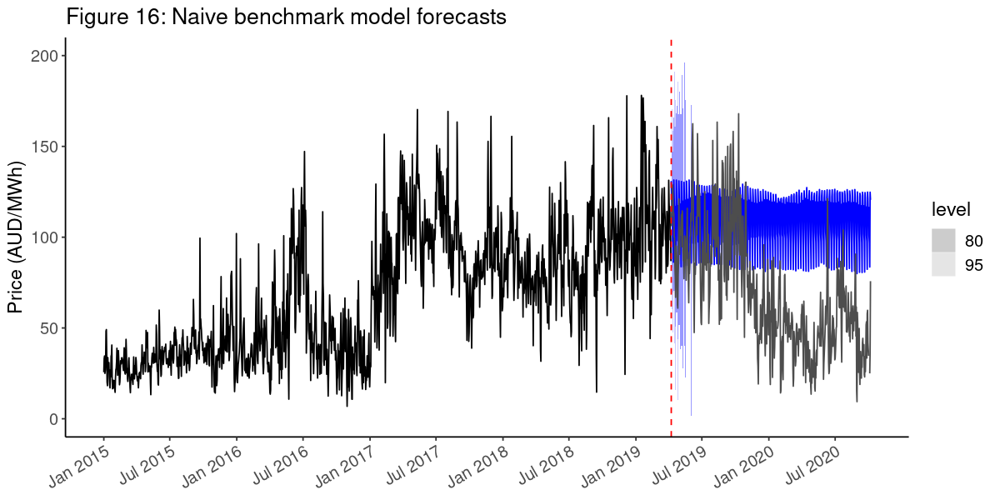

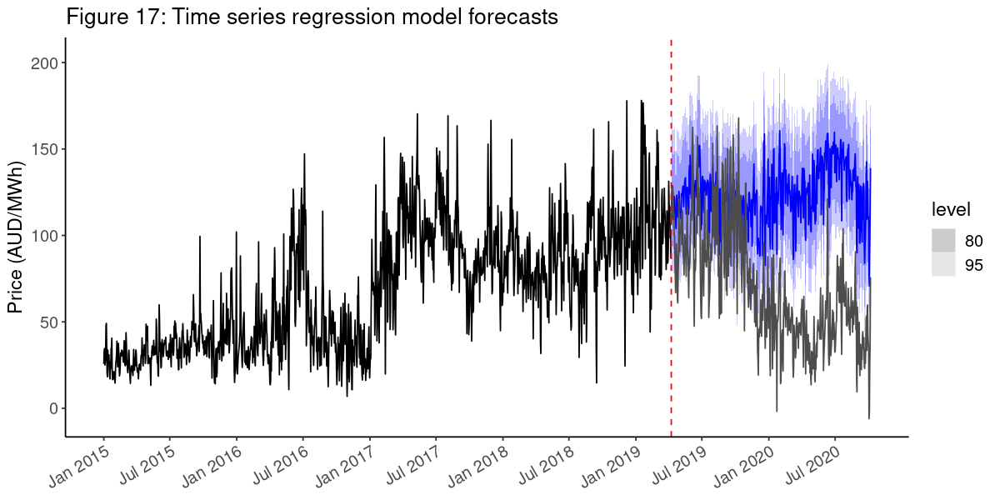

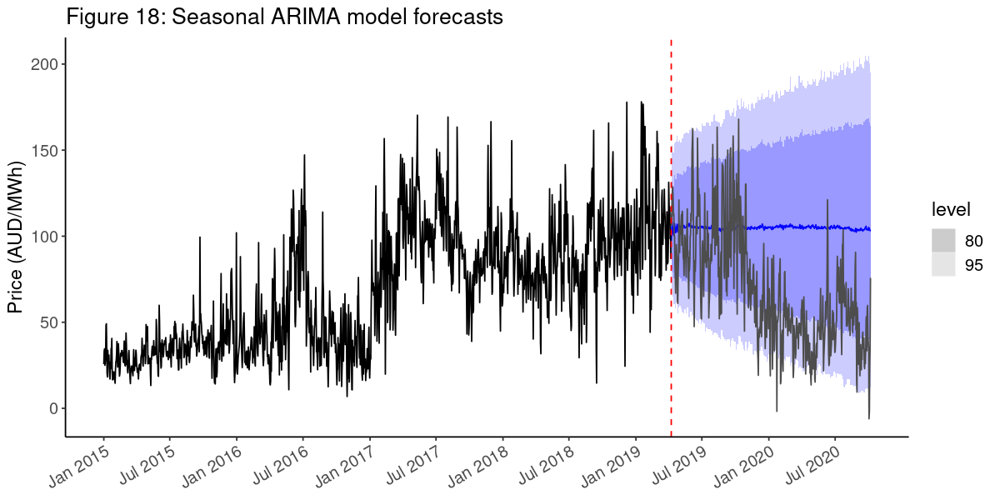

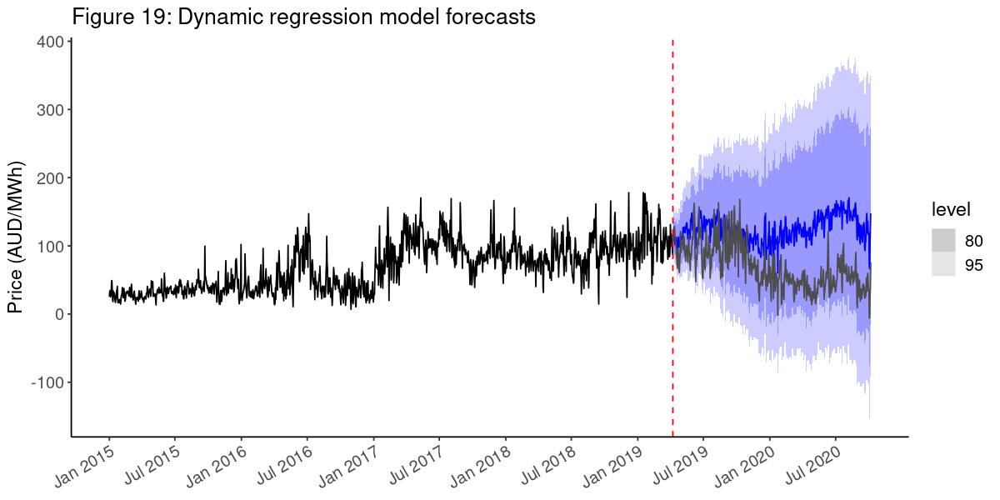

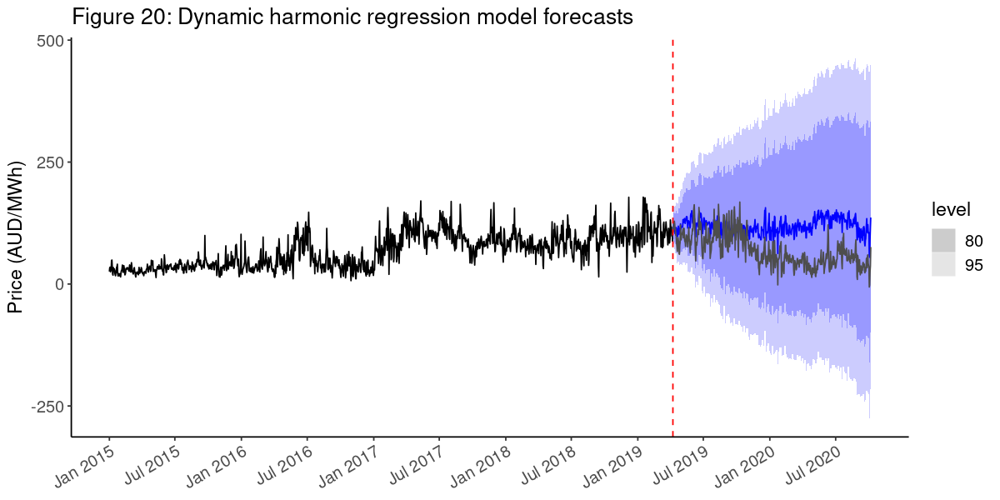

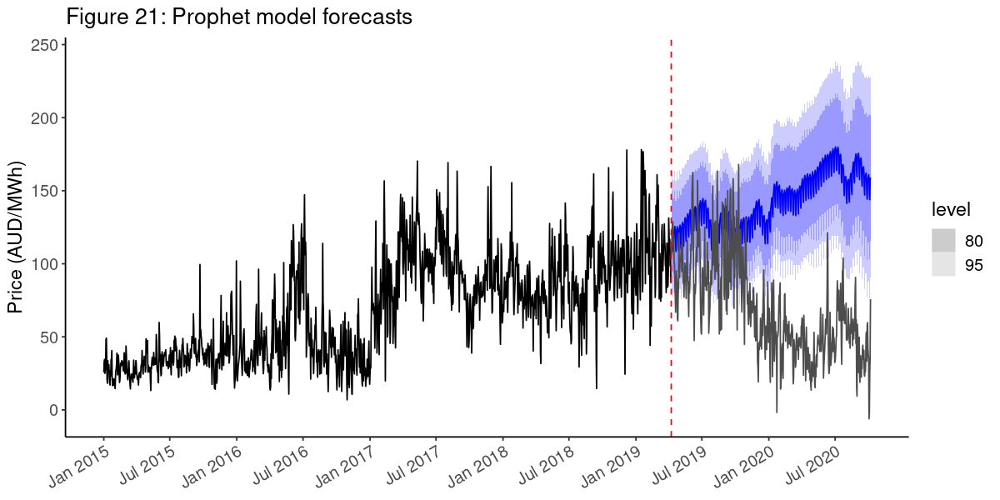

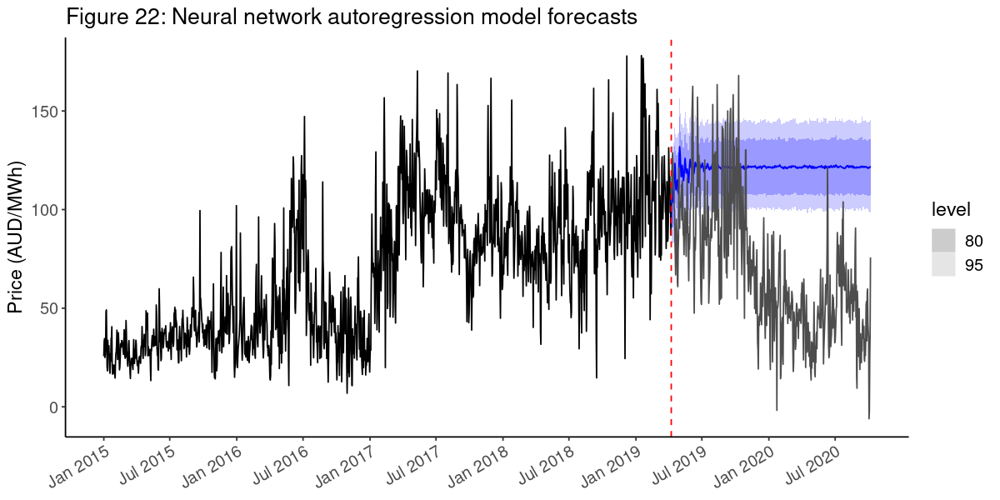

In [31]:
options(repr.plot.width=10, repr.plot.height=5)
bmod_fcplot
tslmmod_fcplot
arimamod_fcplot
dregmod_fcplot
dhrmod_fcplot
prophetmod_fcplot
nnmod_fcplot

<br>

#### *Part C - Storage Venture Analysis*

The purpose of this section was to determine the revenue potential of a 70MWh battery storage system, with the proposed strategy being to store electricity when prices were low/unfavourable and sell the stored energy the next day if prices are higher. This is more commonly known as energy arbitrage.

The current analysis made a number of assumptions in addition to those given in the analysis brief, namely:
- The battery is 100% efficient, such that all energy that is stored can be re-sold the next day. That is, there are no conversion or storage inefficiencies
- The battery is able to charge and discharge energy within the course of a single day
- Any changes in intraday electricity prices are ignored
- There is perfect knowledge of the day-ahead recommended retail price
- The activity of storing and later selling the stored energy is a price-taker activity; that is, there is no (material) effect on the electricity market.

Observe that most, if not all, of these assumptions are fairly stringent. As such, they are unlikely to hold in the actual electricity market and the results should be considered the upper bound of the revenue potential.

In general, the use of a battery storage system could generate revenue of at most about 302,000 AUD per annum. Table 3 shows the breakdown by calendar year and Figure 8 presents the distribution of daily revenue by month. 

However, it would be strongly recommended that future work include a sensitivity analysis and incorporate a set of more realistic constraints/parameters to provide a more accurate representation of possible revenue before purchasing the storage system. For example, intraday trading effects should be taken into account because as shown in Figure 9, the fraction of the day negative prices occurred ranged between 2.1% and 62.5% between 2015 and 2020 (excluding those days when intraday prices did not drop below zero at all).

In [32]:
revenue_df <- df %>%
    select(c(date, year, month, price, demand, frac_neg_price, negative_prices)) %>%
    mutate(next_day_price = lead(price),
           price_change = next_day_price - price,
           change_group = case_when(
               price_change < 0 ~ "decrease",
               price_change > 0 ~ "increase",
               TRUE ~ "no change"),
           action = ifelse(price_change > 0, "store and sell next day", "sell in RTM"),
           storage_revenue = ifelse(action == "store and sell next day", price_change * 70, 0),
           )

In [33]:
revenue_by_year <- revenue_df %>%
    as_tibble() %>%
    na.omit() %>%
    filter(storage_revenue > 0) %>%
    group_by(year) %>%
    summarise(total_estimated_revenue = sum(storage_revenue),
              median = median(storage_revenue),
              `25th quantile` = quantile(storage_revenue, probs = 0.25),
              `75th quantile` = quantile(storage_revenue, probs = 0.75),
              `interquartile range` = IQR(storage_revenue),
              `median absolute deviation` = mad(storage_revenue),
              mean = mean(storage_revenue),
              `standard deviation` = sd(storage_revenue),
             )

total_revenue <- revenue_df %>%
    as_tibble() %>%
    na.omit() %>%
    filter(storage_revenue > 0) %>%
    summarise(total_estimated_revenue = sum(storage_revenue),
              median = median(storage_revenue),
              `25th quantile` = quantile(storage_revenue, probs = 0.25),
              `75th quantile` = quantile(storage_revenue, probs = 0.75),
              `interquartile range` = IQR(storage_revenue),
              `median absolute deviation` = mad(storage_revenue),
              mean = mean(storage_revenue),
              `standard deviation` = sd(storage_revenue),
             )

"Table 3: Estimated storage system revenue by calendar year plus summary statistics"
revenue_summary_stats <- bind_rows(revenue_by_year, total_revenue) %>%
    mutate(across(where(is.numeric), round, digits = 2))
revenue_summary_stats

[1] "Table 3: Estimated storage system revenue by calendar year plus summary statistics"

year,total_estimated_revenue,median,25th quantile,75th quantile,interquartile range,median absolute deviation,mean,standard deviation
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
2015,94915.87,342.03,164.83,597.15,432.33,304.17,521.52,749.24
2016,219237.45,698.11,333.64,1267.93,934.29,672.28,1185.07,2748.60
2017,200263.32,817.58,329.51,1598.18,1268.67,841.58,1118.79,1020.10
2018,321688.88,833.43,417.42,1563.41,1145.99,798.99,1767.52,6370.17
2019,665973.93,924.10,451.26,1753.27,1302.01,849.66,3486.77,22896.87
2020,310469.10,598.12,261.49,1082.22,820.73,566.71,2141.17,11602.03
NA,1812548.55,667.00,308.69,1301.59,992.90,649.89,1703.52,11016.83


Note that in Figure 8, the upper limit of the numeric axis was stopped at 5,000 even though there were values outside this range. The reasoning behind this decision was to show the distribution of estimated revenue around the median value, which was hidden if the total range of values was included in the figure. However, this also indicated that there are times when the magnitude of the additional revenue from the use of a storage system has the potential to be quite significant. 

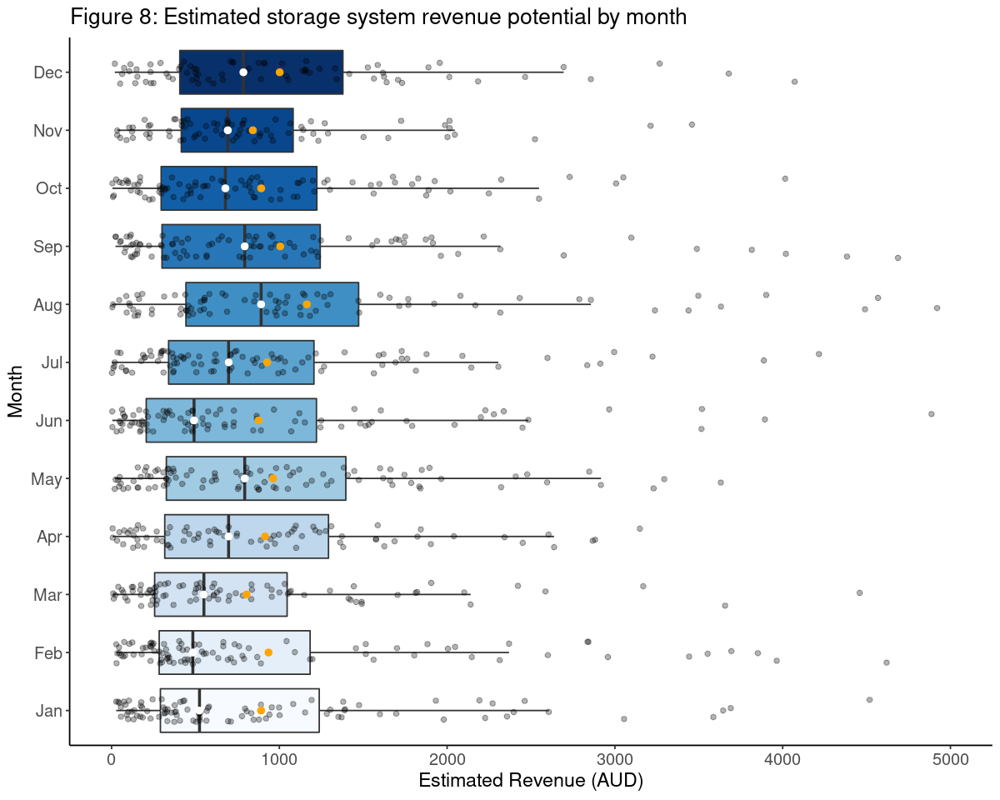

In [34]:
num_colours <- length(unique(df$month))
new_palette <- colorRampPalette(brewer.pal(9, "Blues"))(num_colours)

options(repr.plot.width=10, repr.plot.height=8)
revenue_df %>%
    as_tibble() %>% 
    filter(storage_revenue > 0) %>%
    group_by(month) %>% 
    ggplot(aes(x = month, y = storage_revenue, fill = month)) +
    geom_boxplot(notch = FALSE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Month",
         y = "Estimated Revenue (AUD)",
         title = "Figure 8: Estimated storage system revenue potential by month") +
    scale_fill_manual(values = new_palette) +
    scale_y_continuous(limits = c(0, 5000)) +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

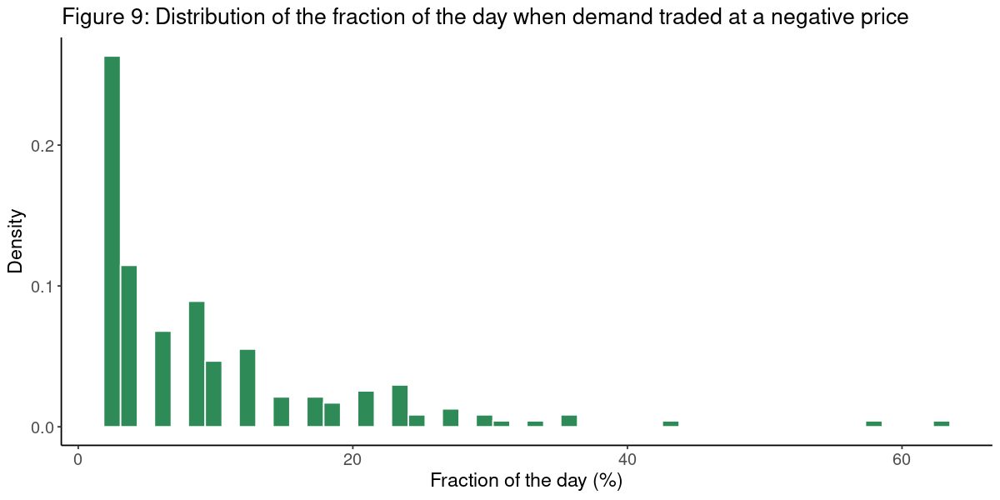

In [35]:
options(repr.plot.width=10, repr.plot.height=5)
revenue_df %>%
    filter(frac_neg_price > 0) %>%
    ggplot(aes(frac_neg_price * 100)) +
    geom_histogram(aes(y=..density..), bins = 50, fill = 'seagreen', col = 'white') +
    labs(title = "Figure 9: Distribution of the fraction of the day when demand traded at a negative price",
         x = "Fraction of the day (%)", 
         y = "Density") +
    theme_report()

<br>

---

### **Appendix A - Research Brief**

**Understanding the local electricity market**

*📖 Background*
You work for an energy company in Australia. Your company builds solar panel arrays and then sells the energy they produce to industrial customers. The company wants to expand to the city of Melbourne in the state of Victoria. 

Prices and demand for electricity change every day. Customers pay for the energy received using a formula based on the local energy market's daily price.

Your company's pricing committee wants your team to estimate energy prices for the next 12-18 months to use those prices as the basis for contract negotiations.

In addition, the VP of strategy is researching investing in storage capacity (i.e., batteries) as a new source of revenue. The plan is to store some of the energy produced by the solar panels when pricing conditions are unfavorable and sell it by the next day on the open market if the prices are higher. 

*💾 The data*
You have access to over five years of energy prices ([source](https://www.kaggle.com/aramacus/electricity-demand-in-victoria-australia)):

- "date" - from January 1, 2015, to October 6, 2020.
- "demand" - daily electricity demand in MWh.
- "price" - recommended retail price in AUD/MWh.
- "demand_pos_price" - total daily demand at a positive price in MWh.
- "price_positive" - average positive price, weighted by the corresponding intraday demand in AUD/MWh.
- "demand_neg_price" - total daily demand at a negative price in MWh.
- "price_negative" - average negative price, weighted by the corresponding intraday demand in AUD/MWh.
- "frac_neg_price" - the fraction of the day when the demand traded at a negative price.
- "min_temperature" - minimum temperature during the day in Celsius.
- "max_temperature" - maximum temperature during the day in Celsius.
- "solar_exposure" - total daily sunlight energy in MJ/m^2.
- "rainfall" - daily rainfall in mm.
- "school_day" - "Y" if that day was a school day, "N" otherwise.
- "holiday" - "Y" if the day was a state or national holiday, "N" otherwise.

Note: The price was negative during some intraday intervals, so energy producers were paying buyers rather than vice-versa.

*💪 Competition challenge*

Create a report that covers the following:

1. How do energy prices change throughout the year? Are there any patterns by season or month of the year?
2. Build a forecast of daily energy prices the company can use as the basis of its financial planning.
3. Provide guidance on how much revenue the energy storage venture could generate per year using retail prices and a 70MWh storage system.
4. Include an executive summary of your recommendations at the beginning.

<br>

### **Appendix B - Supplementary EDA Figures**

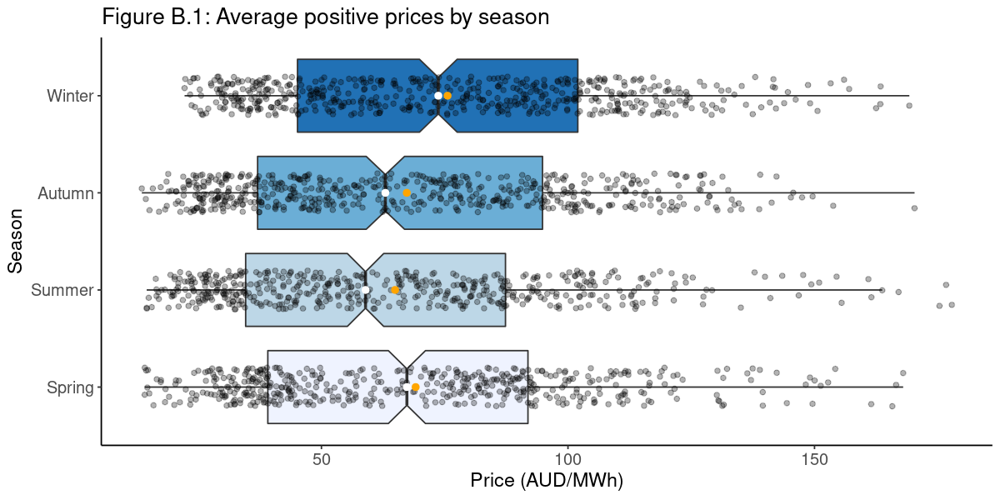

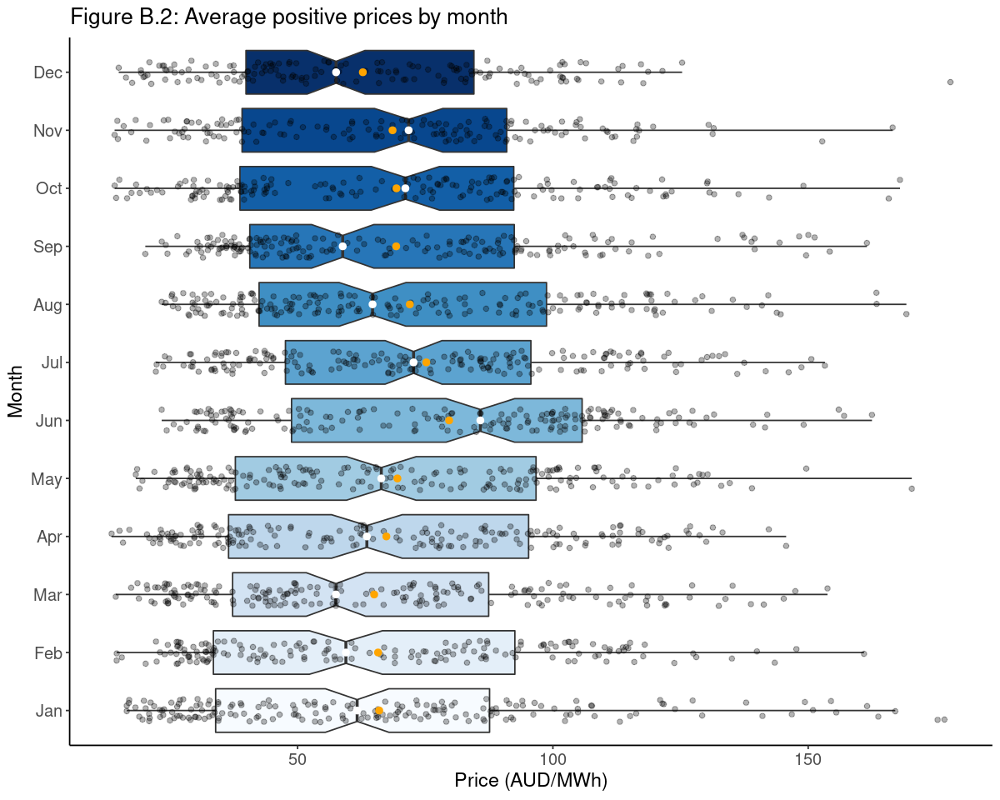

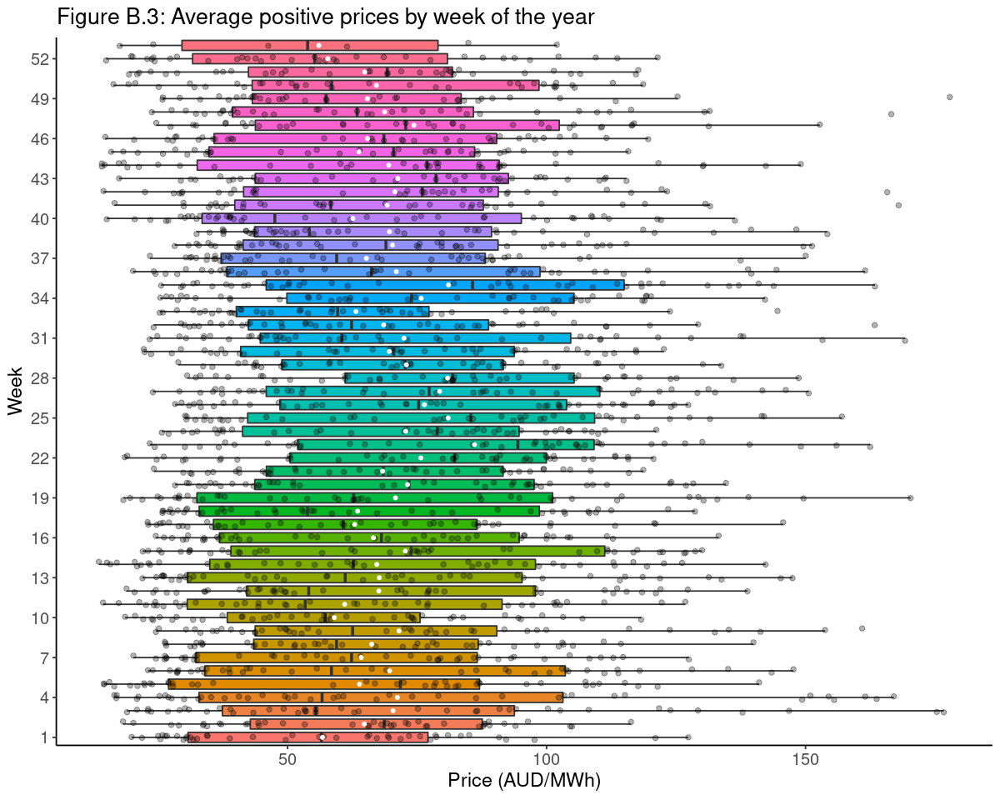

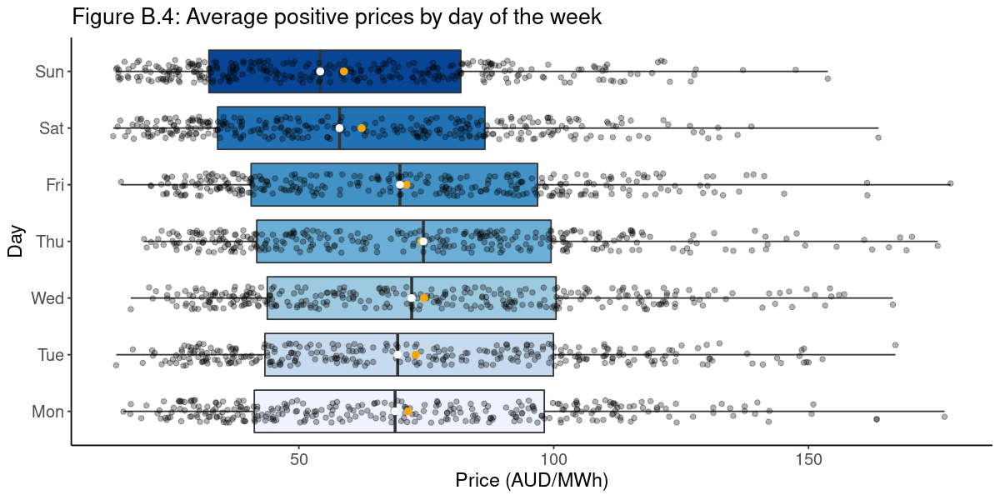

In [36]:
options(repr.plot.width=10, repr.plot.height=5)
df %>%
    as_tibble() %>% 
    group_by(calendarseason) %>% 
    ggplot(aes(x = calendarseason, y = adjprice_positive, fill = calendarseason)) +
    geom_boxplot(notch = TRUE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Season",
         y = "Price (AUD/MWh)",
         title = "Figure B.1: Average positive prices by season") +
    scale_fill_brewer() +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

# extend the blues palette from 9 to 12 colours   
num_colours <- length(unique(df$month))
new_palette <- colorRampPalette(brewer.pal(9, "Blues"))(num_colours)

options(repr.plot.width=10, repr.plot.height=8)
df %>%
    as_tibble() %>% 
    group_by(month) %>% 
    ggplot(aes(x = month, y = adjprice_positive, fill = month)) +
    geom_boxplot(notch = TRUE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Month",
         y = "Price (AUD/MWh)",
         title = "Figure B.2: Average positive prices by month") +
    scale_fill_manual(values = new_palette) +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

options(repr.plot.width=10, repr.plot.height=8)
df %>%
    as_tibble() %>% 
    group_by(weekofyear) %>% 
    ggplot(aes(x = factor(weekofyear), y = adjprice_positive, fill = factor(weekofyear))) +
    geom_boxplot(notch = FALSE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "white", size = 1) +
    labs(x = "Week",
         y = "Price (AUD/MWh)",
         title = "Figure B.3: Average positive prices by week of the year") +
    scale_x_discrete(breaks = seq(1, 52, by = 3)) +
    guides(fill = "none") +
    coord_flip() +
    theme_report() 

options(repr.plot.width=10, repr.plot.height=5)
df %>%
    as_tibble() %>% 
    group_by(dayofweek) %>% 
    ggplot(aes(x = dayofweek, y = adjprice_positive, fill = dayofweek)) +
    geom_boxplot(notch = FALSE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Day",
         y = "Price (AUD/MWh)",
         title = "Figure B.4: Average positive prices by day of the week") +
    scale_fill_brewer() +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

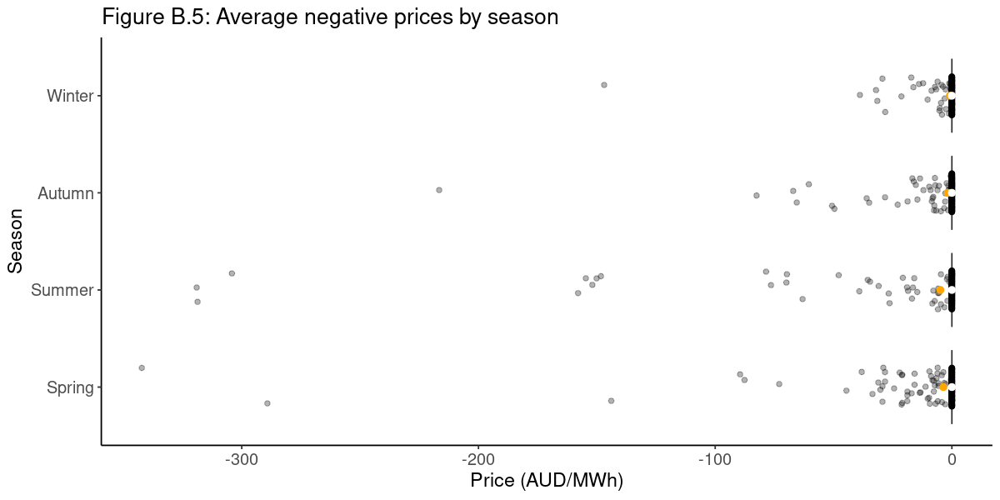

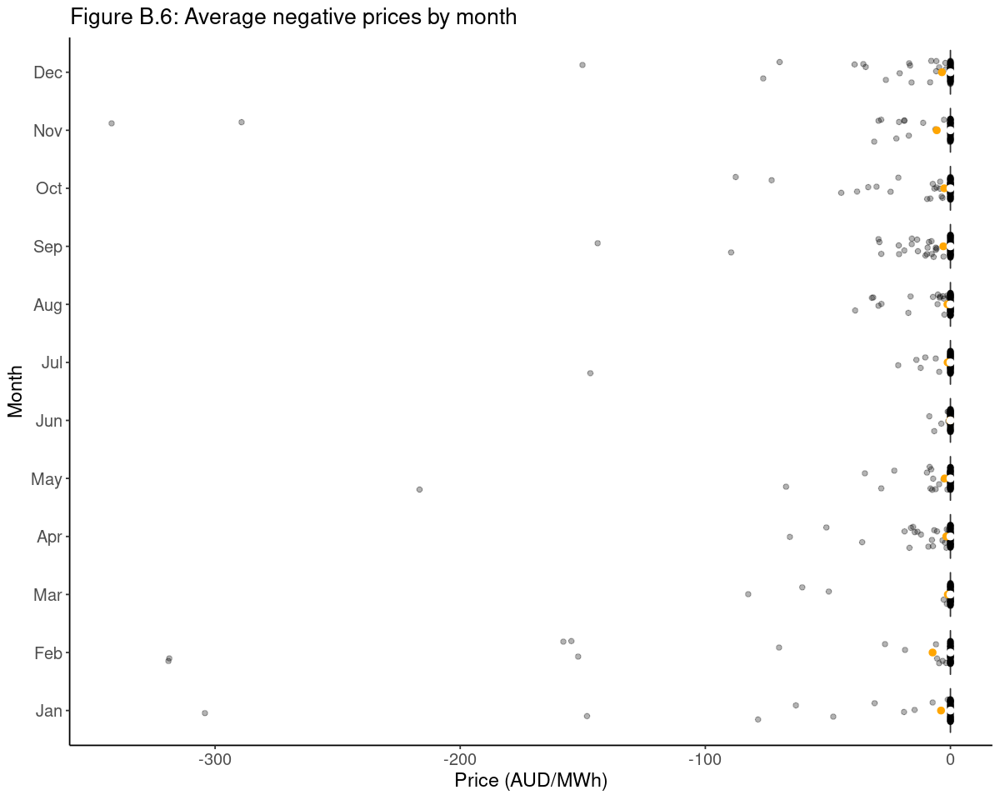

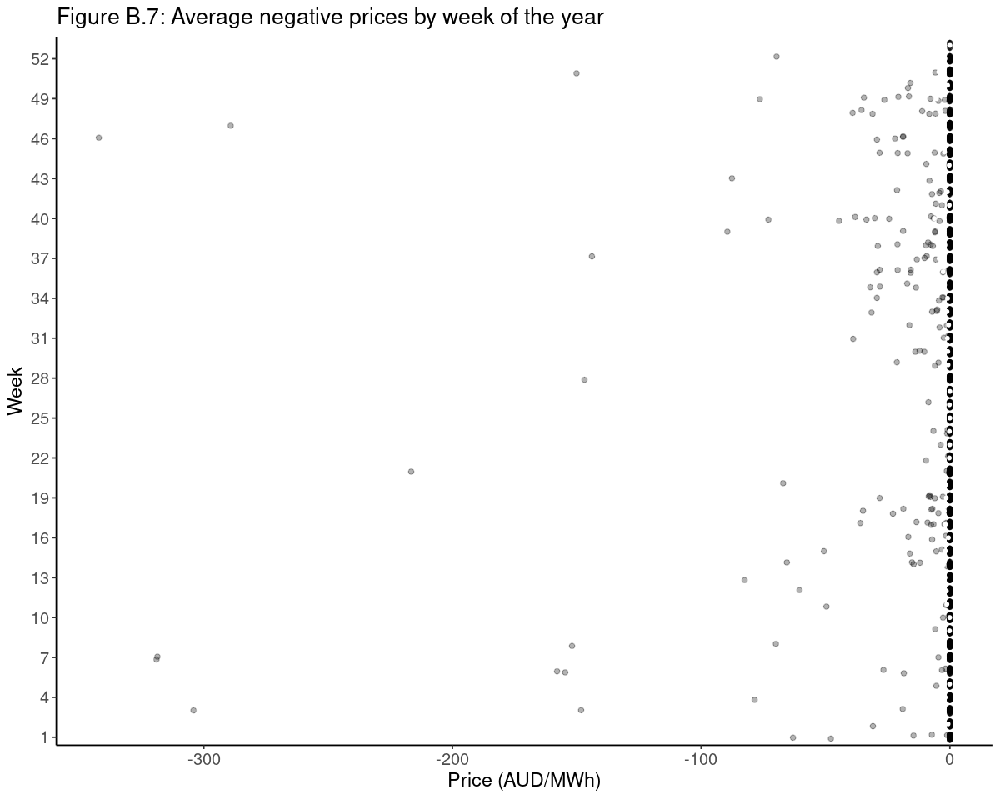

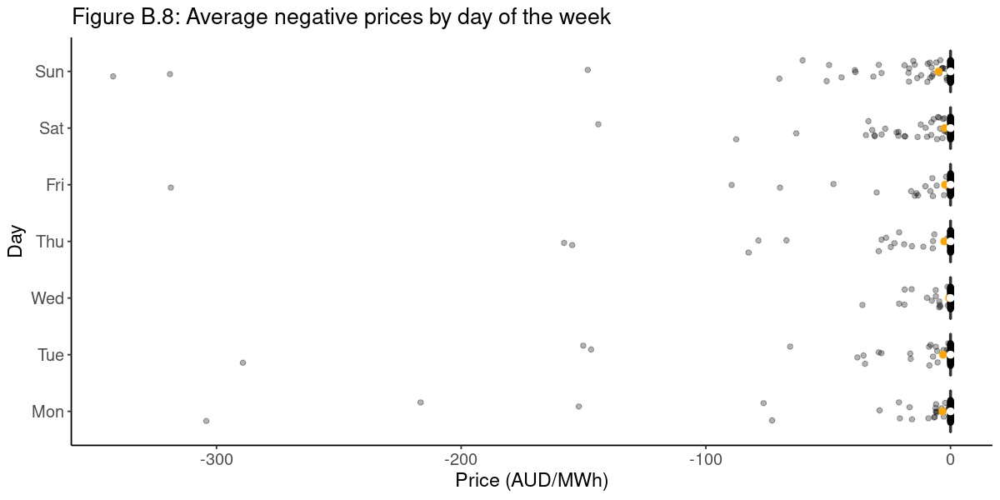

In [37]:
options(repr.plot.width=10, repr.plot.height=5)
df %>%
    as_tibble() %>% 
    group_by(calendarseason) %>% 
    ggplot(aes(x = calendarseason, y = price_negative, fill = calendarseason)) +
    geom_boxplot(notch = TRUE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Season",
         y = "Price (AUD/MWh)",
         title = "Figure B.5: Average negative prices by season") +
    scale_fill_brewer() +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

# extend the blues palette from 9 to 12 colours   
num_colours <- length(unique(df$month))
new_palette <- colorRampPalette(brewer.pal(9, "Blues"))(num_colours)

options(repr.plot.width=10, repr.plot.height=8)
df %>%
    as_tibble() %>% 
    group_by(month) %>% 
    ggplot(aes(x = month, y = price_negative, fill = month)) +
    geom_boxplot(notch = TRUE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Month",
         y = "Price (AUD/MWh)",
         title = "Figure B.6: Average negative prices by month") +
    scale_fill_manual(values = new_palette) +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

options(repr.plot.width=10, repr.plot.height=8)
df %>%
    as_tibble() %>% 
    group_by(weekofyear) %>% 
    ggplot(aes(x = factor(weekofyear), y = price_negative, fill = factor(weekofyear))) +
    geom_boxplot(notch = FALSE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "white", size = 1) +
    labs(x = "Week",
         y = "Price (AUD/MWh)",
         title = "Figure B.7: Average negative prices by week of the year") +
    scale_x_discrete(breaks = seq(1, 52, by = 3)) +
    guides(fill = "none") +
    coord_flip() +
    theme_report() 

options(repr.plot.width=10, repr.plot.height=5)
df %>%
    as_tibble() %>% 
    group_by(dayofweek) %>% 
    ggplot(aes(x = dayofweek, y = price_negative, fill = dayofweek)) +
    geom_boxplot(notch = FALSE, outlier.shape = NA) +
    geom_jitter(width = 0.2, alpha = 0.3) +
    stat_summary(fun = mean, geom="point", colour = "orange", size = 2) +
    stat_summary(fun = median, geom="point", colour = "white", size = 2) +
    labs(x = "Day",
         y = "Price (AUD/MWh)",
         title = "Figure B.8: Average negative prices by day of the week") +
    scale_fill_brewer() +
    guides(fill = "none") +
    coord_flip() +
    theme_report()

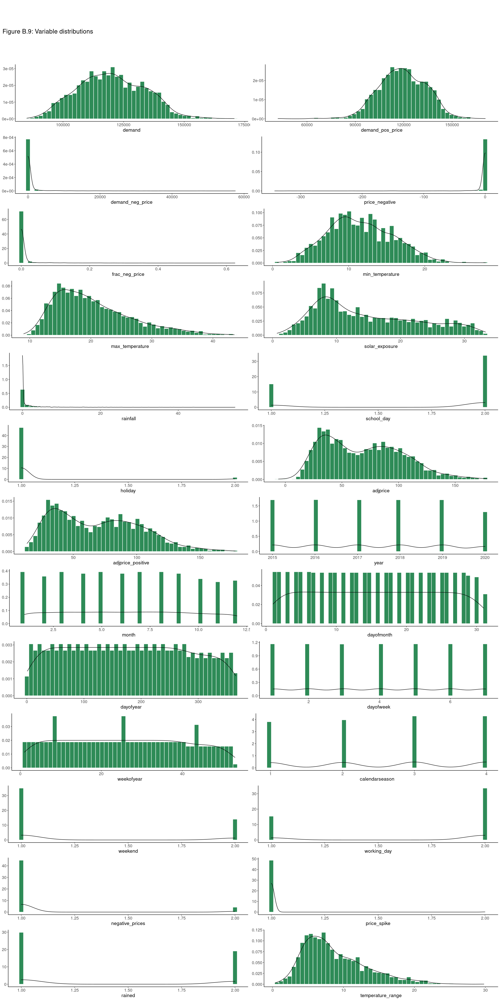

In [38]:
# histograms / density plots
i <- 1

for (col in 2:ncol(df)) {
  feature <- colnames(df)[col]
  if (feature %!in% c("price", "price_positive", "adjprice_negative")) {
    ggpl <- ggplot(df, aes(x = as.numeric(.data[[feature]]))) +
      geom_histogram(aes(y=..density..), bins = 50, fill = 'seagreen', col = 'white') +
      geom_density() +
      xlab(feature) +
      ylab(NULL) +
      theme_report()
    
    assign(paste0("p", i), ggpl)
    i <- i + 1
  }
}

options(repr.plot.width=20, repr.plot.height=60)
title = addJointTitle("Figure B.9: Variable distributions")
plot_plots <- plot_grid(p1, p2, p3, p4, p5, p6, p7, p8, p9, p10, p11, p12, p13, p14, p15, p16, p17, p18, p19, p20, p21, p22, p23, p24, p25, p26, ncol = 2)
plot_grid(title, plot_plots, ncol = 1, rel_heights = c(0.1, 1.5))

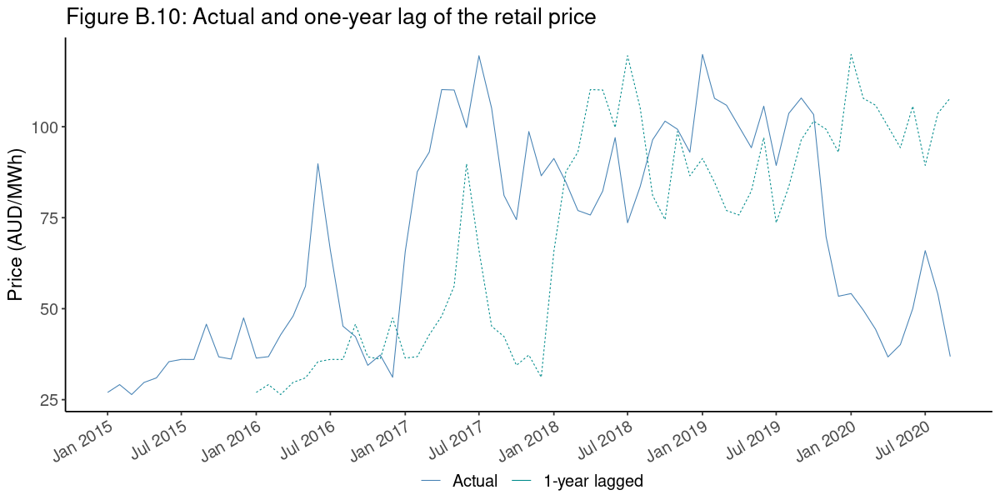

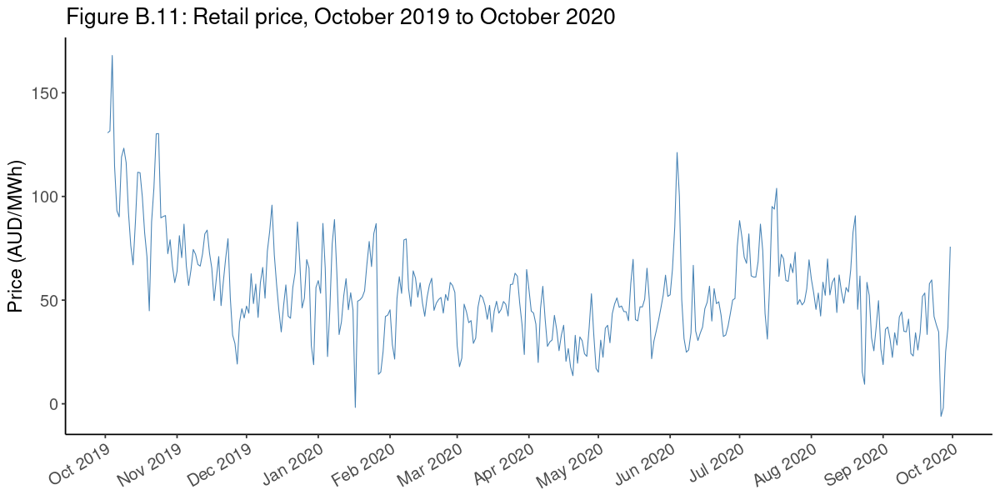

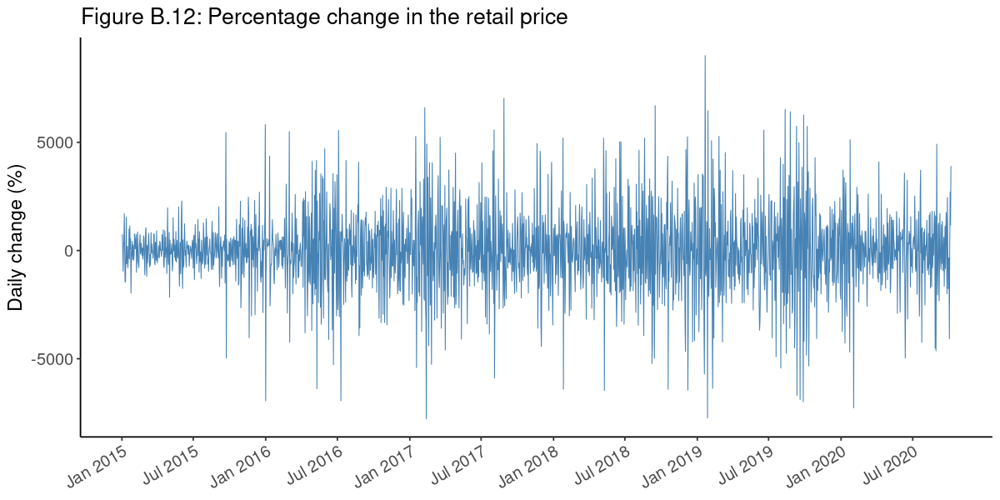

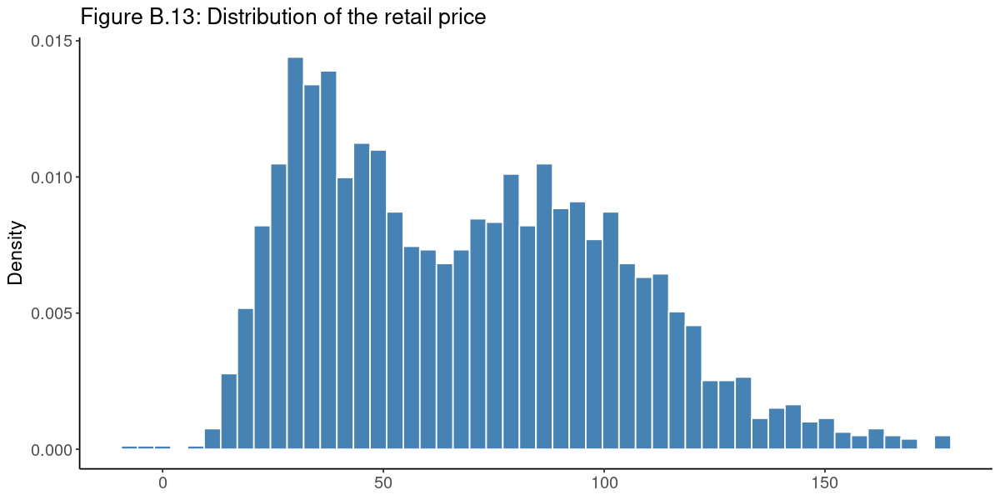

In [39]:
# price eda
# aggregate the data into a monthly periodicity
df_monthly <- data.table::copy(df)
df_monthly$date <- as.Date(df_monthly$date)
df_monthly$date_ym <- as.yearmon(df_monthly$date)

df_monthly <- df_monthly %>% 
    select(date_ym, date, adjprice, adjprice_positive, price_negative) %>% 
    group_by(date_ym) %>% 
    summarise_all(mean) %>% 
    mutate(yearly_lag = lag(adjprice, n = 12),
           monthly_lag = lag(adjprice, n = 1))

# plot the actual prices against their yearly lag
six_monthly_breaks <- seq(min(df_monthly$date), max(df_monthly$date), by = "6 months")

options(repr.plot.width=10, repr.plot.height=5)
df_monthly %>% 
    filter(date_ym < "Oct 2020") %>% # as it's not a full month
    pivot_longer(!c(date_ym, date), names_to = "var", values_to = "value") %>% 
    filter(var %in% c("adjprice", "yearly_lag")) %>% 
    mutate(is_lag = var == "yearly_lag") %>% 
    ggplot(aes(x = date, y = value, col = var)) +
    geom_line(size = 0.3, aes(linetype = is_lag)) +
    scale_x_date(breaks = six_monthly_breaks, labels = date_format("%b %Y")) +
    scale_colour_manual(name = NULL,
                        breaks = c("adjprice", "yearly_lag"),
                        labels = c("Actual", "1-year lagged"),
                        values = c("steelblue", "darkcyan")) +
    scale_linetype(guide = 'none') +
    labs(title = "Figure B.10: Actual and one-year lag of the retail price",
         x = NULL,
         y = "Price (AUD/MWh)") +
    theme_report_angled() +
    theme(legend.position = "bottom", 
          legend.margin = margin(t = -10))

# plot twelve months of data
monthly_breaks <- seq(as.Date(max(df$date) - 365), as.Date("2020-10-07"), by = "1 month")

df %>%
    filter(date <= max(date) & date > max(date) - 365) %>% 
    ggplot(aes(x = date, y = adjprice)) +
    geom_line(col = "steelblue", size = 0.3) +
    scale_x_date(breaks = monthly_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure B.11: Retail price, October 2019 to October 2020",
         x = NULL,
         y = "Price (AUD/MWh)") +
    theme_report_angled()

# plot the differenced series
df %>% 
    ggplot(aes(x = date, y = (adjprice_diff*100))) +
    geom_line(col = "steelblue", size = 0.3) +
    scale_x_date(breaks = date_breaks, labels = date_format("%b %Y")) +
    labs(title = "Figure B.12: Percentage change in the retail price",
         x = NULL,
         y = "Daily change (%)") +
    theme_report_angled()

# plot the histogram of the adjusted series
df %>% 
    ggplot(aes(adjprice)) +
    geom_histogram(aes(y=..density..), bins = 50, fill = 'steelblue', col = 'white') +
    labs(title = "Figure B.13: Distribution of the retail price",
         x = NULL, 
         y = "Density") +
    theme_report()

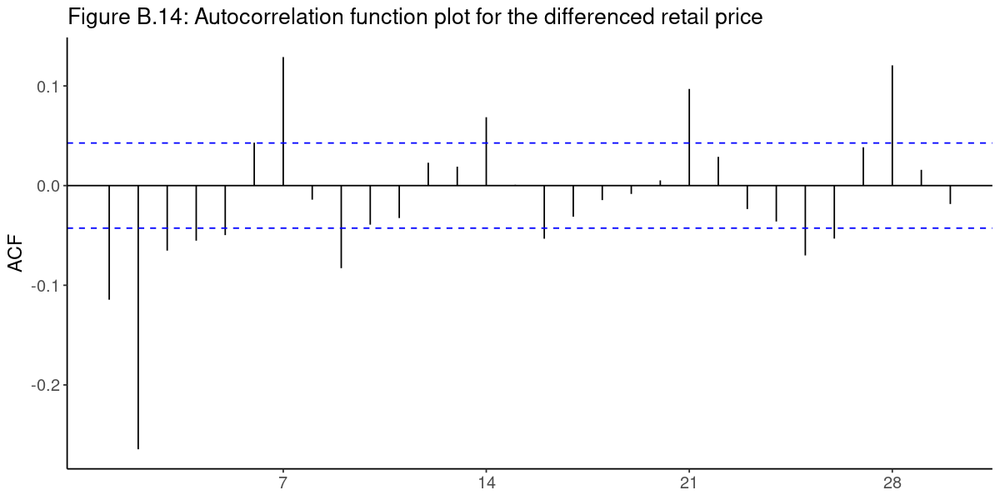

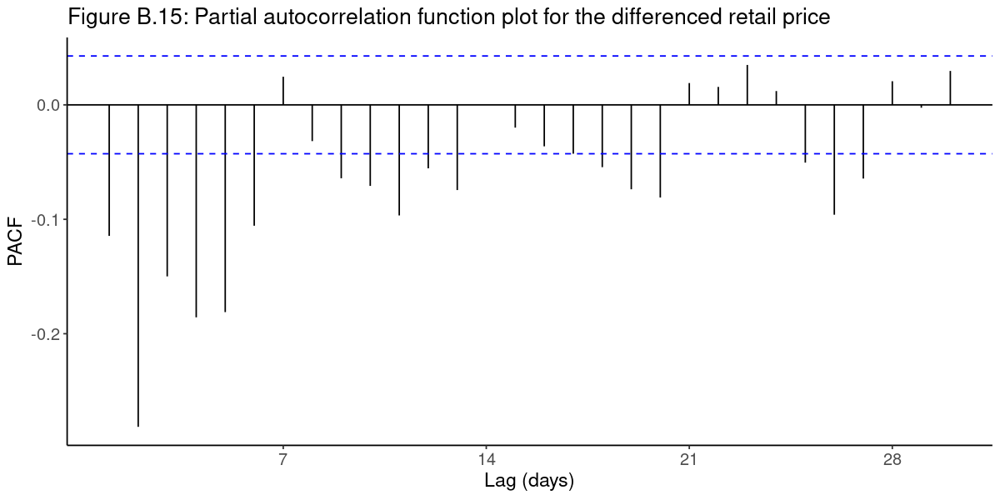

In [40]:
# 30-day differenced acf and pacf plots
df %>% 
    ACF(adjprice_diff, lag_max = 30) %>% 
    autoplot() +
    labs(x = NULL,
         y = "ACF",
         title = "Figure B.14: Autocorrelation function plot for the differenced retail price") +
    theme_report()

df %>% 
    PACF(adjprice_diff, lag_max = 30) %>% 
    autoplot() +
    labs(x = "Lag (days)",
         y = "PACF",
         title = "Figure B.15: Partial autocorrelation function plot for the differenced retail price") +
         theme_report()

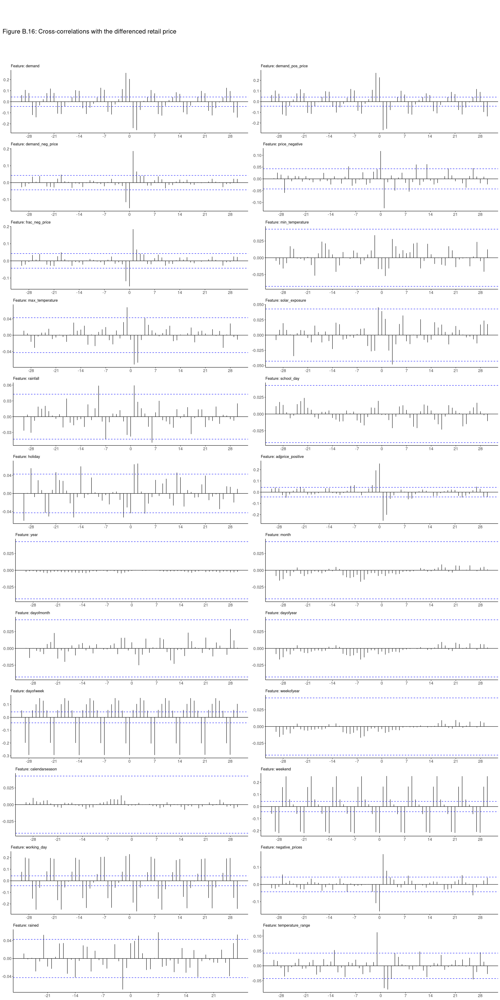

In [41]:
# ccf analysis
i <- 1

for (col in 3:ncol(df)) {
    if (col %!in% c(5, 15, 17, 28, 31:40)) {
        feature <- colnames(df)[col]
        ccf_pl <- df %>% CCF(adjprice_diff, .data[[feature]]) %>% 
        autoplot() + 
        labs(subtitle = paste0("Feature: ", feature),
             x = NULL,
             y = NULL) +
        theme_report()

    assign(paste0("p", i), ccf_pl)
    i <- i + 1
    }
}

options(repr.plot.width=20, repr.plot.height=60)
title = addJointTitle("Figure B.16: Cross-correlations with the differenced retail price")
plot_plots <- plot_grid(p1, p2, p3, p4, p5, p6, p7, p8, p9, p10, p11, p12, p13, p14, p15, p16, p17, p18, p19, p20, p21, p22, p23, p24, ncol = 2)
plot_grid(title, plot_plots, ncol = 1, rel_heights = c(0.1, 1.5))

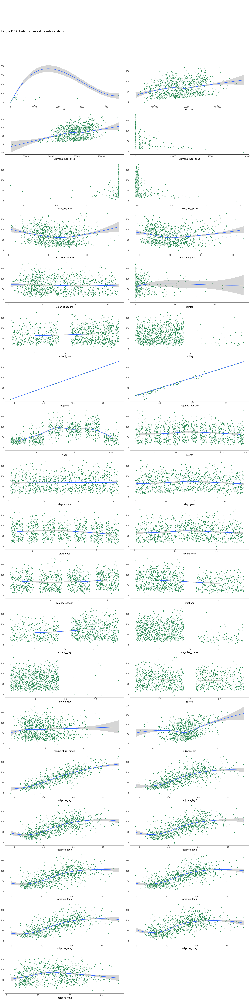

In [53]:
# feature scatter plots
i <- 1
for (col in 1:ncol(df_num)) {
    feature <- colnames(df_num)[col]
    # feature <- vars[col]
    ggpl <- ggplot(df_num, aes(x = .data[[feature]], y = adjprice)) +
        geom_jitter(shape = 21, fill = "seagreen", colour = "white") +
        stat_smooth(formula = y ~ x, method = "loess") + 
        labs(x = feature, y = NULL) +
        theme_report()

    assign(paste0("p", i), ggpl)
    i <- i + 1
}

options(repr.plot.width=20, repr.plot.height=80)
title = addJointTitle("Figure B.17: Retail price-feature relationships")
plot_plots <- plot_grid(p1, p2, p3, p4, p5, p6, p7, p8, p9, p10, p11, p12, p13, p14, p15, p16, p17, p18, p19, p20, p21, p22, p23, p24, p25, p26, p27, p28, p29, p30, p31, p32, 
                        p33, p34, p35, p36, p37, ncol = 2)
plot_grid(title, plot_plots, ncol = 1, rel_heights = c(0.1, 1.5))

<br>

### **Appendix C - Supplementary Modelling Figures**

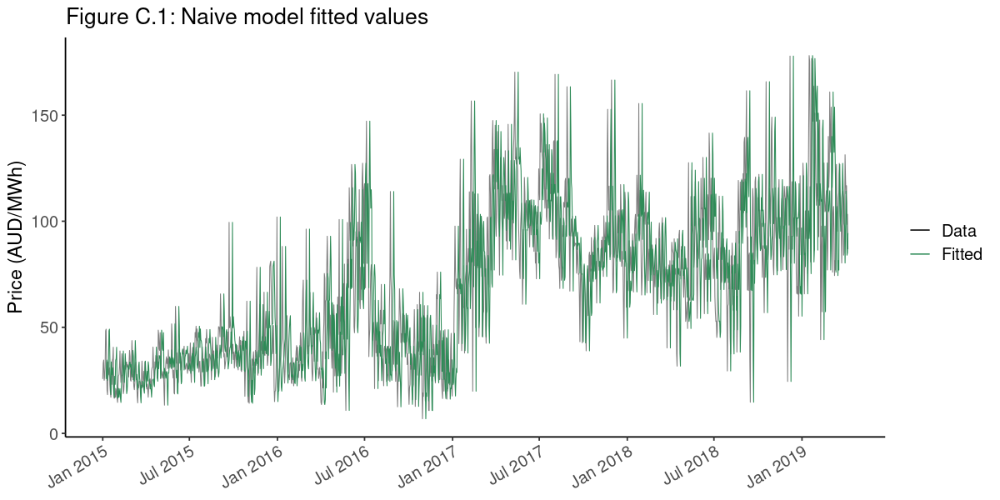

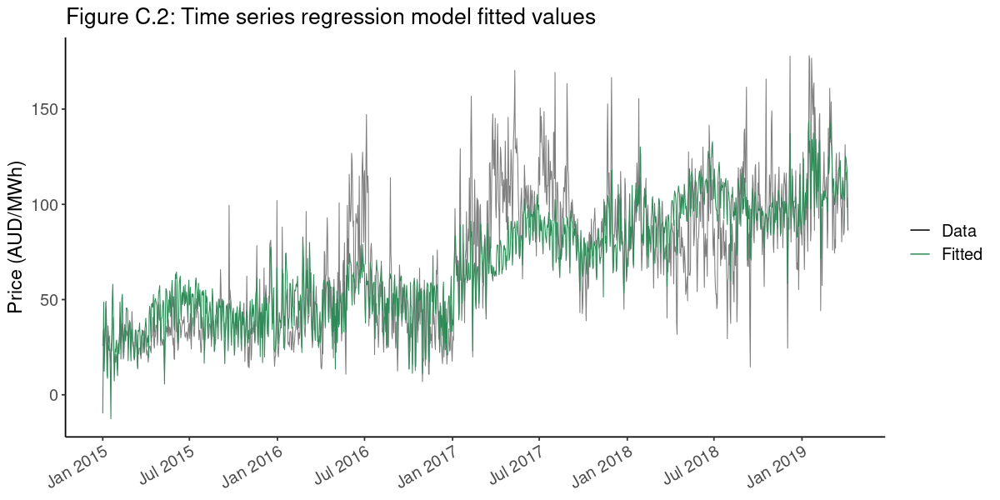

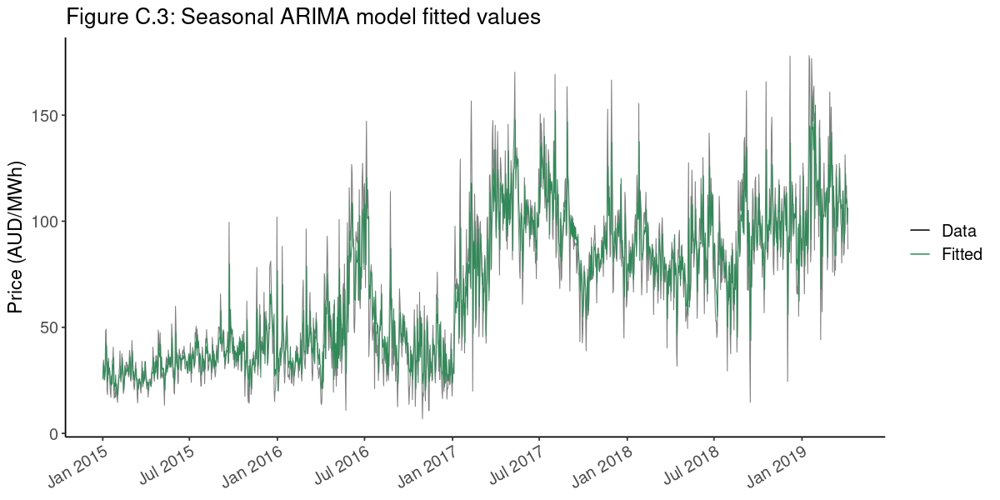

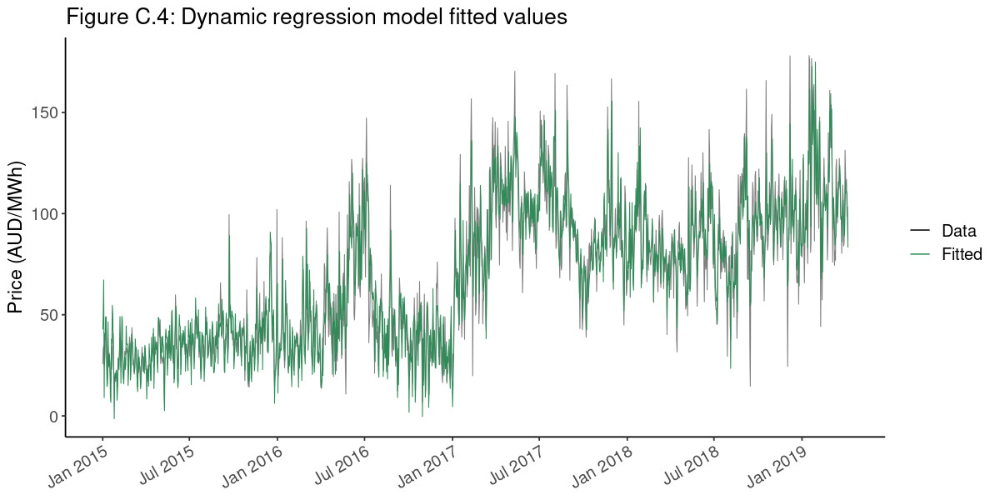

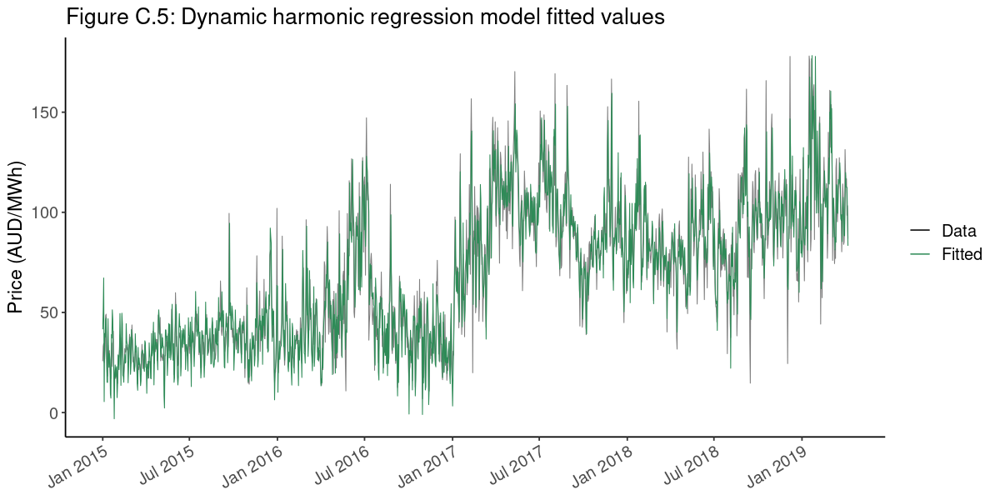

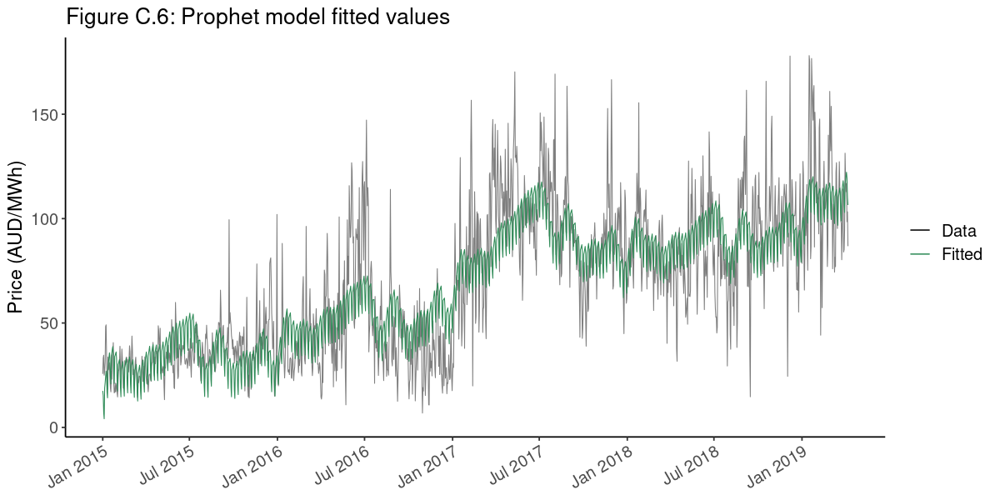

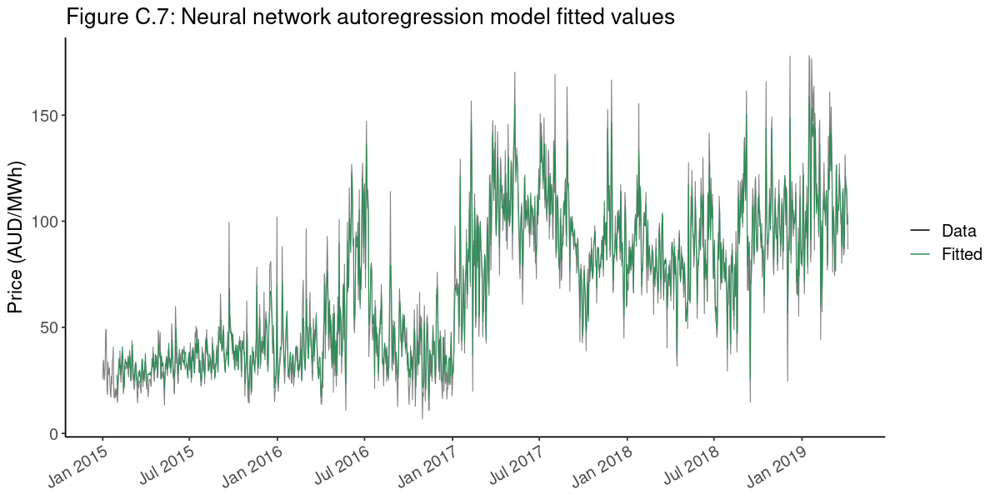

In [43]:
options(repr.plot.width=10, repr.plot.height=5)
bmod_fitplot
tslmmod_fitplot
arimamod_fitplot
dregmod_fitplot
dhrmod_fitplot
prophetmod_fitplot
nnmod_fitplot

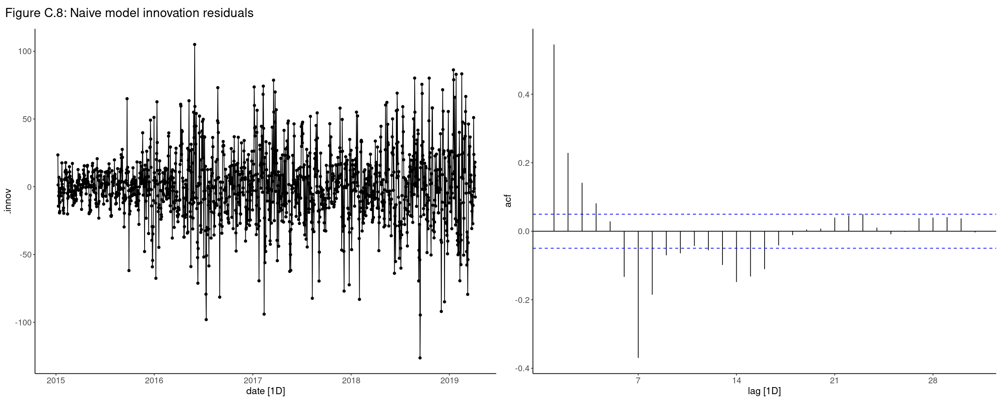

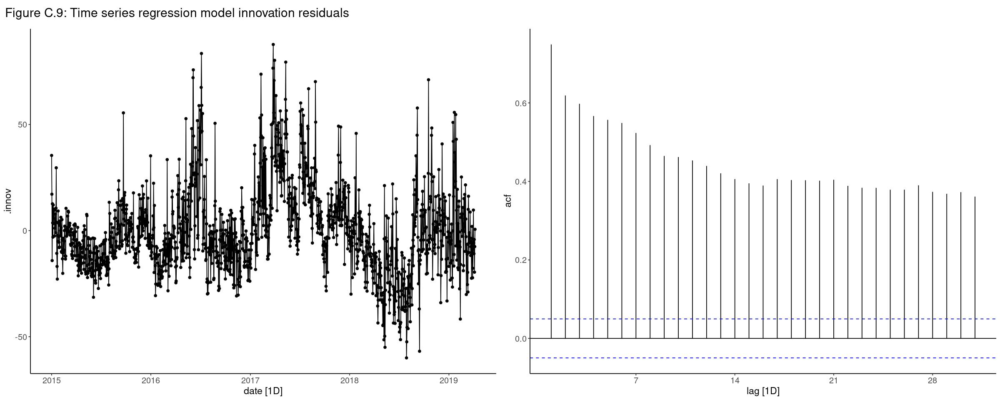

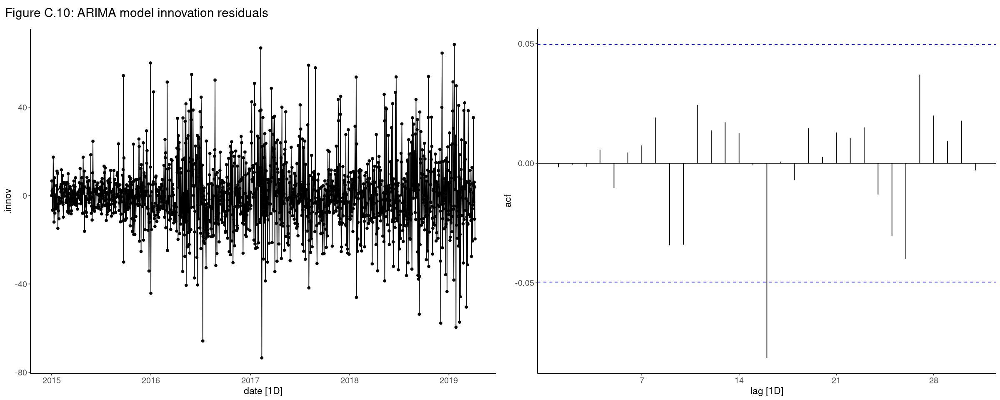

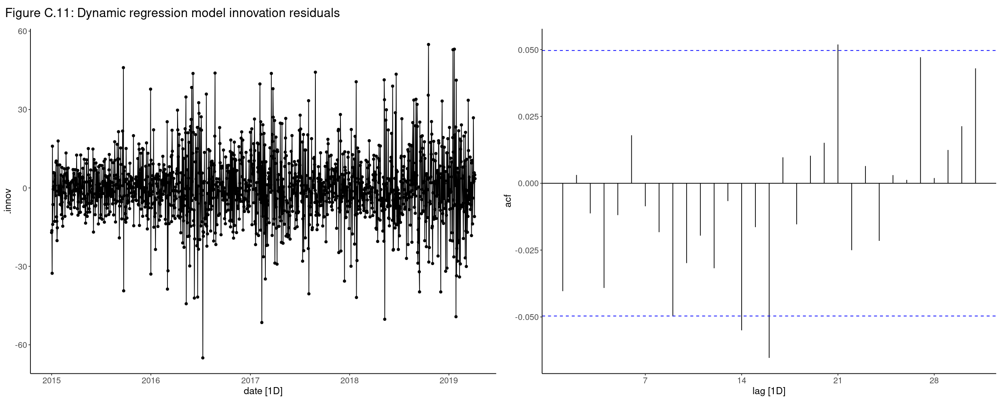

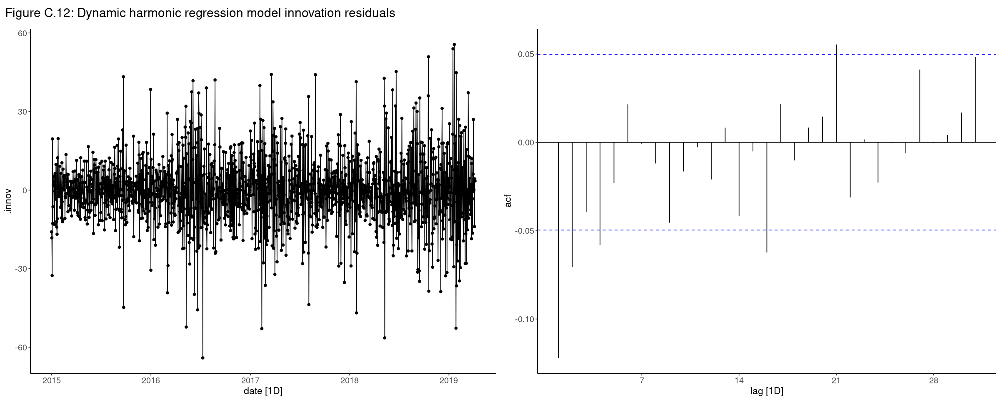

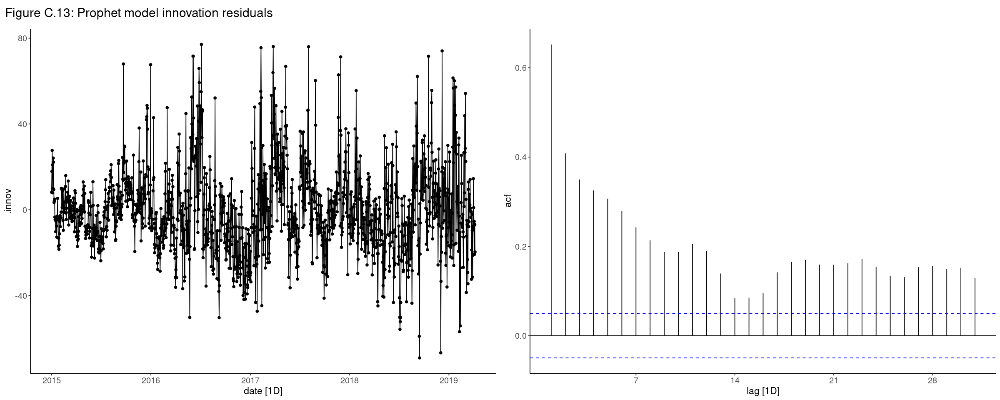

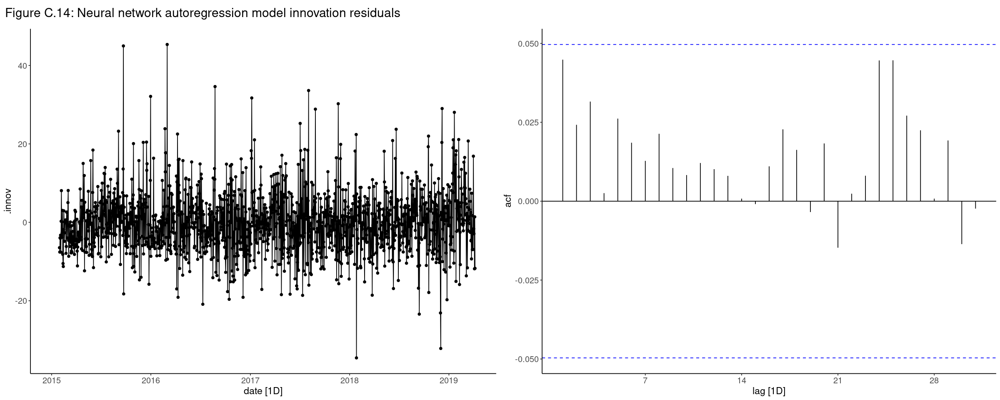

In [54]:
options(repr.plot.width=20, repr.plot.height=8)
plotggtsresiduals2(bmod, plot_title = "Figure C.8: Naive model innovation residuals")
plotggtsresiduals2(tslmmod, plot_title = "Figure C.9: Time series regression model innovation residuals")
plotggtsresiduals2(arimamod, plot_title = "Figure C.10: ARIMA model innovation residuals")
plotggtsresiduals2(dregmod, plot_title = "Figure C.11: Dynamic regression model innovation residuals")
plotggtsresiduals2(dhrmod, plot_title = "Figure C.12: Dynamic harmonic regression model innovation residuals")
plotggtsresiduals2(prophetmod, plot_title = "Figure C.13: Prophet model innovation residuals")
plotggtsresiduals2(nnmod, plot_title = "Figure C.14: Neural network autoregression model innovation residuals")